Use GPU when training convolutional neural networks, with CPU it is slow.


Runtime/Change runtime type/Hardware accelerator: GPU

Suorituspalvelu/Muuta suorituspalvelun tyyppiä/Laitteistokiihdytin: GPU

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
np.set_printoptions(precision=2,linewidth=1000,suppress=True)

**Convolutional Neural Networks, CNNs**, are neural networks for classification of image data

[DeepLearningAI: Convolutional Neural Networks](https://www.youtube.com/watch?v=ArPaAX_PhIs&list=PLkDaE6sCZn6Gl29AoE31iwdVwSG-KnDzF)

https://www.v7labs.com/blog/convolutional-neural-networks-guide

F. Chollet: Deep Learning with Python, 2nd ed, Manning  





Their coefficients are (usually small, 3x3,5x5,...) matrices (**filter, kernel**), that are used to find "shapes" from the images.



Basic operation is the **convolution** of two matrices:


Slide the smaller matrix on top of the larger, multiply corresponding elements and add the results = element of the convolution matrix at the corresponding location.

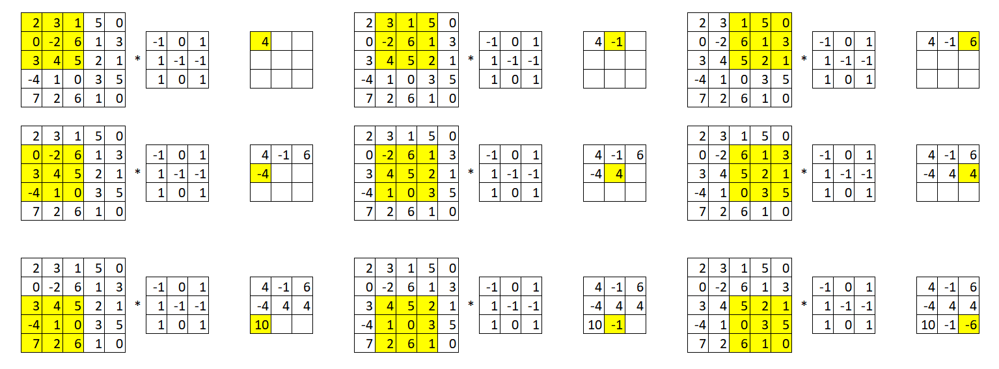

For example, if the elements of the image matrix are between  0...1 (0 = black, 1 = white), then the filters below "find"
the collections of 3 white pixels
vertically/horizontally/diagonally
from the image


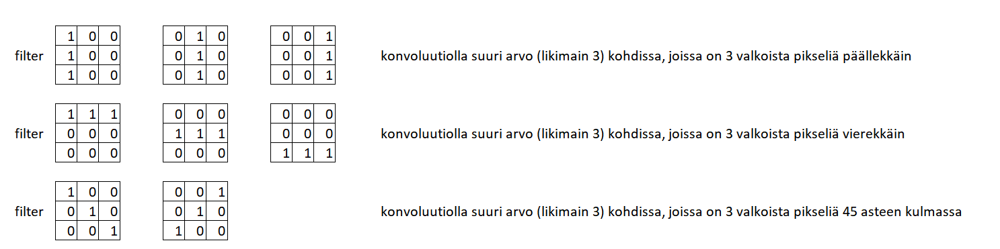

In [ ]:
#load mnist-data
from tensorflow import keras
from keras.api.datasets import mnist
(xtrain, ytrain), (xtest, ytest) = mnist.load_data()
print(xtrain.shape)
print(xtest.shape)

# scale pixel values to 0...1
xtrain = xtrain/255.0
xtest = xtest/255.0



11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
(60000, 28, 28)
(10000, 28, 28)


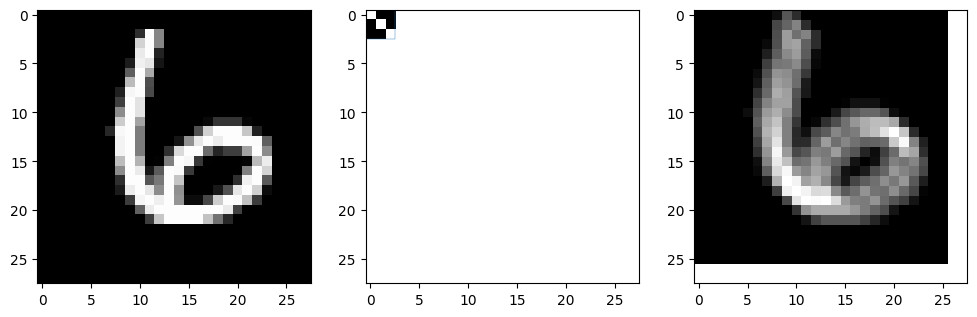

In [ ]:
#convolution
#random picture
k=np.random.randint(0,60000)
xk=xtrain[k]

#filter/kernel, nxn-matrix
n=3
f=np.zeros((n,n))


#f[:,1]=1 #3 white pixels vertically

#f[1,:]=1 #3 white pixels horizontally

#3 white pixels diagonally
f[0,0]=1
f[1,1]=1
f[2,2]=1


#convolution of xk and f
xkf=np.zeros((28-n+1,28-n+1))
for r in range(28-n+1):
  for s in range(28-n+1):
    xkf[r,s]=np.sum(xk[r:r+n,s:s+n]*f)

plt.figure(figsize=(12,6))
plt.subplot(1,3,1)
plt.imshow(xk,cmap='gray')
plt.xlim([-0.5,27.5])
plt.ylim([27.5,-0.5])
plt.subplot(1,3,2)
plt.imshow(f,cmap='gray')
plt.plot([-0.5,n-0.5,n-0.5,-0.5,-0.5],[-0.5,-0.5,n-0.5,n-0.5,-0.5],lw=0.3)
plt.xlim([-0.5,27.5,])
plt.ylim([27.5,-0.5])

plt.subplot(1,3,3)
plt.imshow(xkf,cmap='gray')
plt.xlim([-0.5,27.5,])
plt.ylim([27.5,-0.5])
plt.show()

In [ ]:
print(xk)

[[0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.18 1.   0.53 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.83 0.99 0.53 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.92 0.99 0.14 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.11 0.94 0.9  0.08 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.37 0.99 0.67 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]

In [ ]:
print(xkf)

[[0.   0.   0.   0.   0.   0.   0.   0.   0.18 1.   0.53 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.83 1.17 1.53 0.53 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.92 1.82 1.31 1.53 0.53 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.11 0.94 1.82 1.9  1.13 0.53 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.37 1.1  1.61 1.82 1.07 0.14 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.73 1.36 1.41 1.61 0.9  0.08 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.13 0.96 1.72 1.65 1.3  0.67 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.25 1.12 1.85 1.72 1.28 0.31 0.   0.

**Padding**

Convolution of 5x5 and 3x3-matrices is 3x3

Convolution of 28x28 and 3x3-matrices is 26x26

This is called **valid padding**

**Same padding**: add zeros such that the size doesn't change


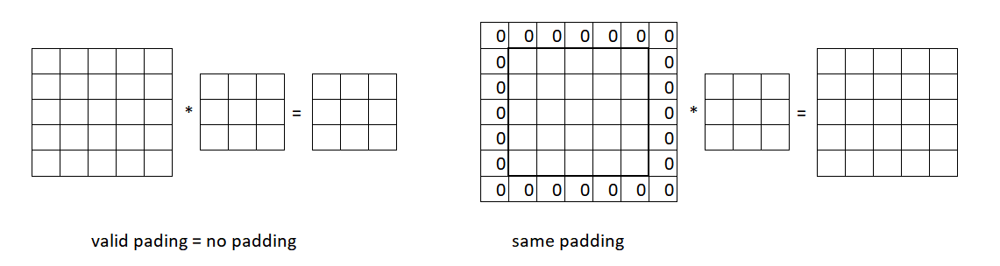

**Pooling**

Decrease the size of a matrix by replacing (for example) each 2x2 part by their max-value (**max-pooling**)

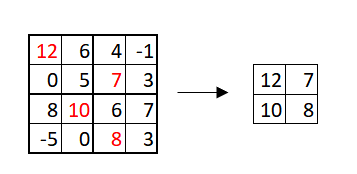

The basic structure of a CNN is such that it contains convolutional and max-pooling layers alternately.

The basic principle is that the size of the matrices decreases and their number (the depth) increases.

When the size is small enough, the elements of the matrices are flattened to a 1D-array, which is used as input to ordinary
dense neural network for classification.


Purpose of the convolutional layers is to "distill" the essential information from the pixel values, and the idea is that the 1D-array from the convolutional layers contains "better coordinates" for the images than the original pixel values.







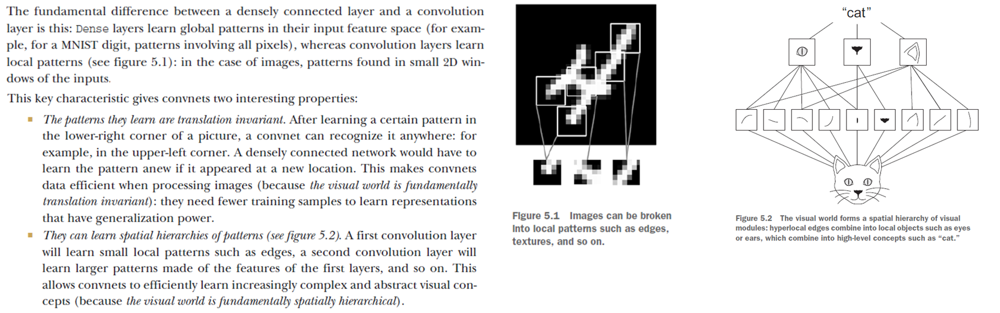

## **MNIST**

CNN to classify MNIST pictures (n1=20, n2=40, n3=100)

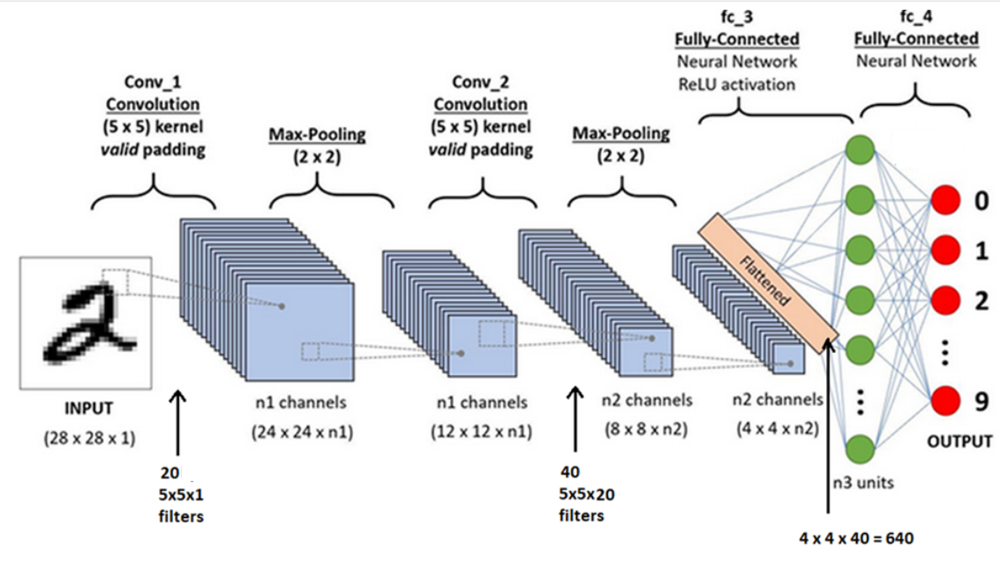

In [ ]:
#images to 3D-arrays, shape (28,28,1)
xtrain=xtrain.reshape((60000,28,28,1))
xtest=xtest.reshape((10000,28,28,1))

In [ ]:
from tensorflow import keras
from keras.api.models import Sequential
from keras.api.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout

In [ ]:
n1=20 #number of filters in the first convolutional layer
n2=40 #number of filters in the second convolutional layer
n3=100 #the number of neurons in the hidden layer
model = Sequential()
model.add(Input(shape=(28,28,1)))
model.add(Conv2D(filters=n1, kernel_size=5, activation='relu'))
#default: padding="valid" (padding='same' -> same padding)
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=n2, kernel_size=5,activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Flatten()) # -> 1D-array
model.add(Dropout(0.5))
model.add(Dense(n3,activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(10,activation='softmax'))

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 24, 24, 20)          │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 12, 12, 20)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 8, 8, 40)            │          20,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 4, 4, 40)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 640)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 640)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 100)                 │          64,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           1,010 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 85,670 (334.65 KB)

 Trainable params: 85,670 (334.65 KB)

 Non-trainable params: 0 (0.00 B)

Note: each filter has also a bias term

20x5x5x1+20=520 coefficients

40x5x5x20+40=20040 coefficients

In [ ]:
from keras.api.optimizers import Adam
model.compile(optimizer=Adam(0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [1]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from keras.api.callbacks import ModelCheckpoint

callback = ModelCheckpoint(
    filepath='/content/drive/MyDrive/mnist_cnn_weights.weights.h5',
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1)

In [ ]:
history=model.fit(xtrain,ytrain,
                  epochs=100,batch_size=1000,
                  validation_data=(xtest,ytest),
                  callbacks=[callback])

Epoch 1/100
55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.4436 - loss: 1.6343
Epoch 1: val_accuracy improved from -inf to 0.94300, saving model to mnist_cnn_weights.weights.h5
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.4644 - loss: 1.5767 - val_accuracy: 0.9430 - val_loss: 0.2005
Epoch 2/100
55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8899 - loss: 0.3601
Epoch 2: val_accuracy improved from 0.94300 to 0.96600, saving model to mnist_cnn_weights.weights.h5
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8913 - loss: 0.3557 - val_accuracy: 0.9660 - val_loss: 0.1114
Epoch 3/100
55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9318 - loss: 0.2290
Epoch 3: val_accuracy improved from 0.96600 to 0.97600, saving model to mnist_cnn_weights.weights.h5
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9321 - loss: 0.2278 - val_accuracy: 0.9760 - val_loss: 0.0802
Epoch 4/100
55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9466 - loss: 0.1802
Epoch 4: val

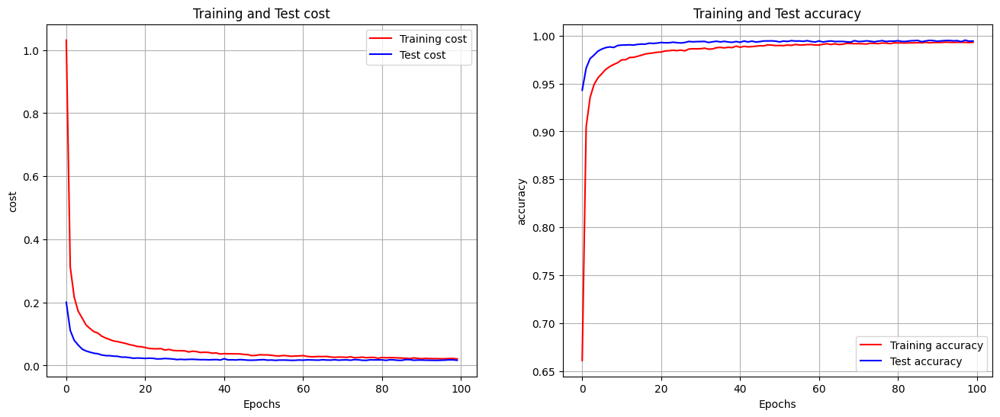

In [ ]:
#kustannusfunktion ja tarkkuuden kuvaajat
train_cost = history.history['loss']
test_cost = history.history['val_loss']
train_acc = history.history['accuracy']
test_acc = history.history['val_accuracy']


plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(train_cost, 'r', label='Training cost')
plt.plot(test_cost, 'b', label='Test cost')
plt.title('Training and Test cost')
plt.xlabel('Epochs')
plt.ylabel('cost')
plt.legend()
plt.grid()


plt.subplot(1,2,2)
plt.plot(train_acc, 'r', label='Training accuracy')
plt.plot(test_acc, 'b', label='Test accuracy')
plt.title('Training and Test accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.grid()
plt.show()

In [ ]:
#load best coefficients
model.load_weights('/content/drive/MyDrive/mnist_cnn_weights.weights.h5')

train_loss,train_acc=model.evaluate(xtrain,ytrain,verbose=0)
test_loss,test_acc=model.evaluate(xtest,ytest,verbose=0)
print(train_acc)
print(test_acc)


0.9988499879837036
0.995199978351593


In [ ]:
#save the model
model.save('/content/drive/MyDrive/mnist_cnn.keras')

In [ ]:
#load later
from keras.api.models import load_model
model=load_model('/content/drive/MyDrive/mnist_cnn.keras')
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 24, 24, 20)          │             520 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 12, 12, 20)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 8, 8, 40)            │          20,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 4, 4, 40)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 640)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 640)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 100)                 │          64,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           1,010 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 257,012 (1003.96 KB)

 Trainable params: 85,670 (334.65 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 171,342 (669.31 KB)

In [ ]:
train_loss,train_acc=model.evaluate(xtrain,ytrain,verbose=0)
test_loss,test_acc=model.evaluate(xtest,ytest,verbose=0)
print(train_acc)
print(test_acc)

0.9988499879837036
0.995199978351593


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


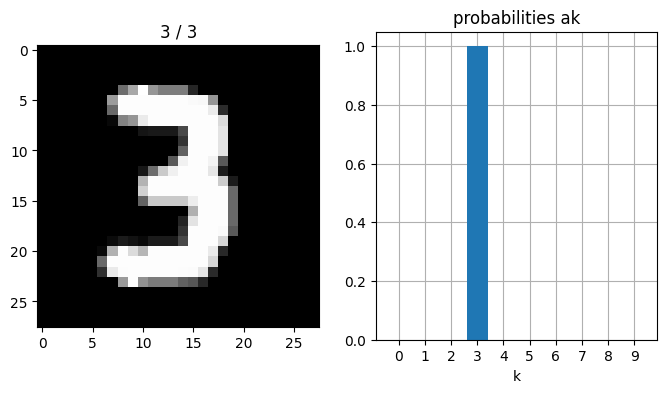

In [ ]:
#test image
k=np.random.randint(10000)
xk=xtest[k].reshape((1,28,28,1))
yk=ytest[k]
ak=model.predict(xk) #predicted probabilities
yk_pred=np.argmax(ak) #predicted class

plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(xk.reshape((28,28)),cmap='gray')
plt.title(str(yk)+' / '+str(yk_pred))
plt.subplot(1,2,2)
plt.bar(np.linspace(0,9,10),ak.reshape((10,)),zorder=2)
plt.grid()
plt.xticks(np.linspace(0,9,10))
plt.xlabel('k')
plt.title('probabilities ak')
plt.show()


In [ ]:
at=model.predict(xtest) #predicted probabilities
ytest_pred=np.argmax(at,axis=1) #predicted classes

313/313 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step


In [ ]:
from sklearn.metrics import confusion_matrix
M=confusion_matrix(ytest, ytest_pred)
print(M)
print(np.sum(np.diag(M))) #number of correctly classified test images

[[ 979    0    0    0    0    0    0    1    0    0]
 [   0 1134    0    0    0    0    0    1    0    0]
 [   1    0 1026    0    1    0    0    4    0    0]
 [   0    0    1 1007    0    2    0    0    0    0]
 [   0    0    0    0  979    0    1    0    0    2]
 [   0    0    0    4    0  884    1    1    0    2]
 [   1    2    0    0    0    1  953    0    1    0]
 [   0    1    0    0    0    0    0 1026    0    1]
 [   3    1    1    1    1    0    0    0  966    1]
 [   0    0    0    0    6    2    0    2    1  998]]
9952


(48, 28, 28, 1)


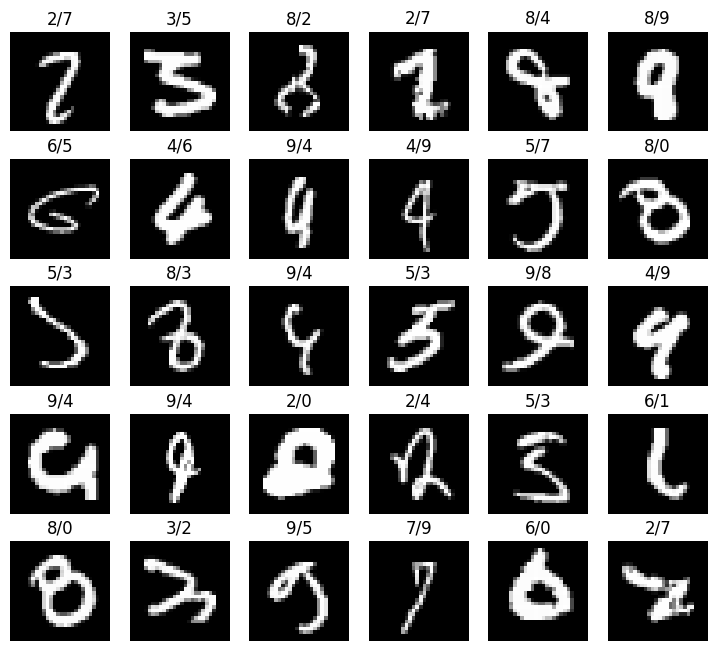

In [ ]:
#30 wrongly classified test images
xtest_wrong=xtest[ytest_pred!=ytest]
print(xtest_wrong.shape)

ytest_wrong=ytest[ytest_pred!=ytest]
ytest_wrong_pred=ytest_pred[ytest_pred!=ytest]

plt.figure(figsize=(9,8))
for k in range(30):
    plt.subplot(5,6,k+1)
    plt.imshow(xtest_wrong[k,:,:,0],cmap='gray')
    plt.axis('off')
    plt.title(str(ytest_wrong[k]) + '/' + str(ytest_wrong_pred[k]))
plt.show()

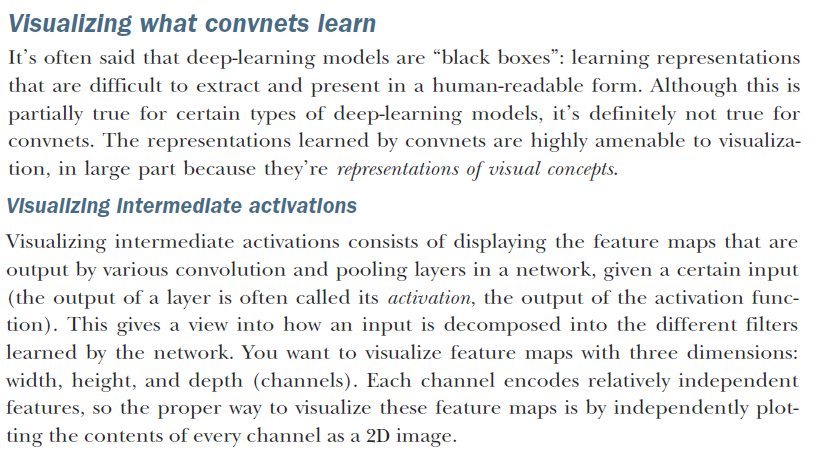

In [ ]:
model.weights

[<KerasVariable shape=(5, 5, 1, 20), dtype=float32, path=conv2d/kernel>,
 <KerasVariable shape=(20,), dtype=float32, path=conv2d/bias>,
 <KerasVariable shape=(5, 5, 20, 40), dtype=float32, path=conv2d_1/kernel>,
 <KerasVariable shape=(40,), dtype=float32, path=conv2d_1/bias>,
 <KerasVariable shape=(640, 100), dtype=float32, path=dense/kernel>,
 <KerasVariable shape=(100,), dtype=float32, path=dense/bias>,
 <KerasVariable shape=(100, 10), dtype=float32, path=dense_1/kernel>,
 <KerasVariable shape=(10,), dtype=float32, path=dense_1/bias>]

In [ ]:
W1=np.array(model.weights[0])
b1=np.array(model.weights[1])
W2=np.array(model.weights[2])
b2=np.array(model.weights[3])
W3=np.array(model.weights[4])
b3=np.array(model.weights[5])
W4=np.array(model.weights[6])
b4=np.array(model.weights[7])

In [ ]:
W1.shape

(5, 5, 1, 20)

In [ ]:
k=0
print(W1[:,:,0,k])

[[ 0.08  0.09 -0.01  0.03  0.1 ]
 [ 0.08 -0.08  0.04  0.   -0.02]
 [-0.09  0.02  0.07  0.03  0.04]
 [ 0.04  0.11 -0.01 -0.04  0.16]
 [ 0.02  0.08 -0.04  0.02  0.06]]


In [ ]:
W2.shape

(5, 5, 20, 40)

In [ ]:
k=0
m=0
print(W2[:,:,k,m])

[[-0.04  0.03  0.05  0.03  0.01]
 [-0.01 -0.02 -0.08 -0.02  0.14]
 [ 0.02 -0.04  0.08  0.08  0.02]
 [ 0.1  -0.04  0.07 -0.02 -0.04]
 [ 0.13  0.06 -0.07 -0.1  -0.05]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


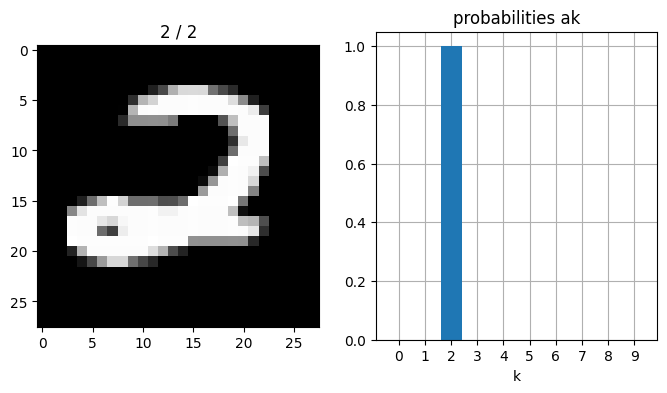

In [ ]:
#test image
k=np.random.randint(10000)
xk=xtest[k].reshape((1,28,28,1))
yk=ytest[k]

ak=model.predict(xk) #predicted probablities
yk_pred=np.argmax(ak) #predicted class

plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(xk.reshape((28,28)),cmap='gray')
plt.title(str(yk)+' / '+str(yk_pred))
plt.subplot(1,2,2)
plt.bar(np.linspace(0,9,10),ak.reshape((10,)),zorder=2)
plt.grid()
plt.xticks(np.linspace(0,9,10))
plt.xlabel('k')
plt.title('probabilities ak')
plt.show()


In [ ]:
xk.shape

(1, 28, 28, 1)

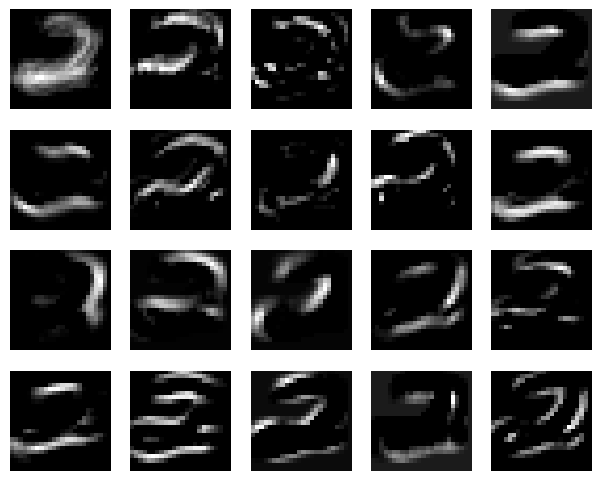

In [ ]:
#convolution1
xk=xk.reshape((28,28))
n=5
conv1=np.zeros((24,24,20))
plt.figure(figsize=(7.5,6))
for m in range(20):
  #filter/kernel, nxn-matrix
  f=W1[:,:,0,m]
  #convolution of xk and f
  for r in range(28-n+1):
    for s in range(28-n+1):
      conv1_rs=np.sum(xk[r:r+n,s:s+n]*f)+b1[m]
      conv1[r,s,m]=np.maximum(conv1_rs,0) #relu
  plt.subplot(4,5,m+1)
  plt.imshow(conv1[:,:,m],cmap='gray')
  plt.xlim([-0.5,23.5])
  plt.ylim([23.5,-0.5])
  plt.axis('off')


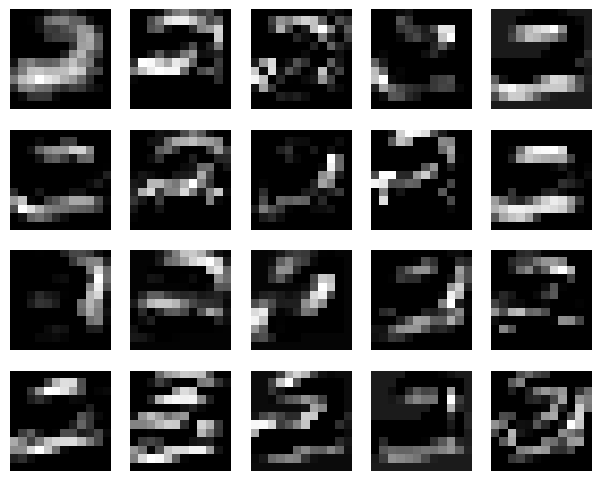

In [ ]:
#maxpooling1
maxpooling1=np.zeros((12,12,20))
for m in range(20):
  M=conv1[:,:,m]
  for r in range(12):
    for s in range(12):
      maxpooling1[r,s,m]=np.max(M[2*r:2*r+2,2*s:2*s+2])

plt.figure(figsize=(7.5,6))
for m in range(20):
  plt.subplot(4,5,m+1)
  plt.imshow(maxpooling1[:,:,m],cmap='gray')
  plt.xlim([-0.5,11.5])
  plt.ylim([11.5,-0.5])
  plt.axis('off')

In [ ]:
print(maxpooling1[:,:,0])

[[0.   0.   0.   0.   0.05 0.11 0.15 0.12 0.02 0.   0.   0.  ]
 [0.   0.   0.01 0.06 0.27 0.33 0.34 0.26 0.25 0.06 0.   0.  ]
 [0.   0.   0.   0.05 0.16 0.15 0.2  0.27 0.4  0.37 0.1  0.  ]
 [0.   0.   0.   0.   0.12 0.16 0.17 0.19 0.4  0.44 0.24 0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.13 0.41 0.43 0.25 0.  ]
 [0.   0.   0.   0.   0.   0.   0.08 0.36 0.47 0.28 0.17 0.  ]
 [0.05 0.29 0.34 0.26 0.25 0.27 0.39 0.5  0.38 0.31 0.05 0.  ]
 [0.19 0.33 0.5  0.51 0.47 0.48 0.49 0.57 0.51 0.2  0.18 0.  ]
 [0.31 0.49 0.55 0.66 0.6  0.56 0.46 0.39 0.28 0.12 0.   0.  ]
 [0.11 0.32 0.36 0.29 0.28 0.18 0.12 0.17 0.15 0.07 0.03 0.  ]
 [0.   0.03 0.14 0.14 0.14 0.02 0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]]


In [ ]:
print(conv1[:,:,0])

[[0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.05 0.08 0.11 0.15 0.12 0.12 0.1  0.02 0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.03 0.   0.09 0.21 0.28 0.33 0.34 0.29 0.26 0.2  0.12 0.08 0.03 0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.01 0.05 0.06 0.21 0.27 0.22 0.22 0.21 0.2  0.22 0.23 0.25 0.19 0.06 0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.05 0.16 0.13 0.11 0.15 0.2  0.16 0.18 0.25 0.26 0.22 0.22 0.03 0.01 0.02 0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.05 0.03 0.09 0.14 0.14 0.12 0.12 0.17 0.27 0.4  0.37 0.37 0.17 0.1  0.08 0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.01 0.12 0.16 0.15 0.14 0.17 0.13 0.19 0.39 0.4  0.39 0.22 0.23 0.11 0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.07 0.21 0.25 0.44 0.25 0.24 0.16 0.   0.  ]
 [0.   0.   0.  

In [ ]:
W2.shape

(5, 5, 20, 40)

In [ ]:
b2.shape

(40,)

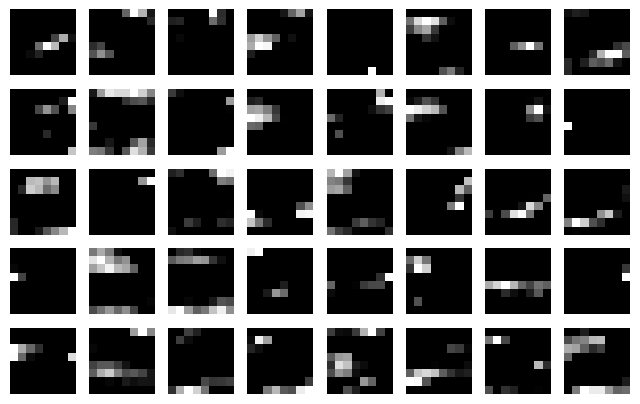

In [ ]:
#convolution2
n=5
conv2=np.zeros((8,8,40))
plt.figure(figsize=(8,5))
for m in range(40):
  #filter/kernel, nxn-matrix
  f=W2[:,:,:,m]
  #convolution of xk and f
  for r in range(8):
    for s in range(8):
      conv2_rs=np.sum(maxpooling1[r:r+n,s:s+n,:]*f)+b2[m]
      conv2[r,s,m]=np.maximum(conv2_rs,0) #relu
  plt.subplot(5,8,m+1)
  plt.imshow(conv2[:,:,m],cmap='gray')
  plt.xlim([-0.5,7.5])
  plt.ylim([7.5,-0.5])
  plt.axis('off')


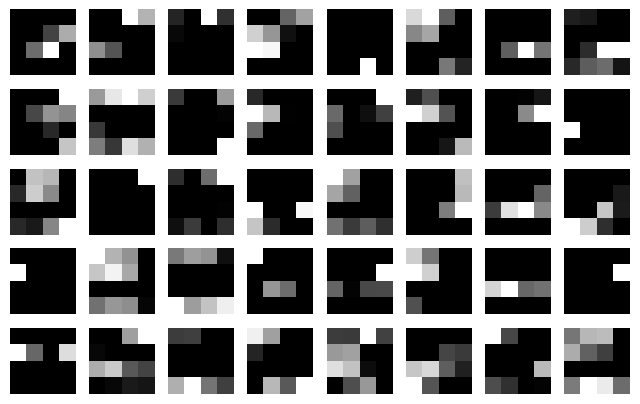

In [ ]:
#maxpooling
maxpooling2=np.zeros((4,4,40))
for m in range(40):
  M=conv2[:,:,m]
  for r in range(4):
    for s in range(4):
      maxpooling2[r,s,m]=np.max(M[2*r:2*r+2,2*s:2*s+2])

plt.figure(figsize=(8,5))
for m in range(40):
  plt.subplot(5,8,m+1)
  plt.imshow(maxpooling2[:,:,m],cmap='gray')
  plt.xlim([-0.5,3.5])
  plt.ylim([3.5,-0.5])
  plt.axis('off')

In [ ]:
maxpooling2[:,:,0]

array([[0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.33, 0.83],
       [0.  , 0.52, 1.23, 0.  ],
       [0.  , 0.  , 0.  , 0.  ]])

In [ ]:
conv2[:,:,0]

array([[0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.33, 0.83, 0.09],
       [0.  , 0.  , 0.  , 0.52, 1.23, 0.9 , 0.  , 0.  ],
       [0.  , 0.  , 0.05, 0.17, 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ]])

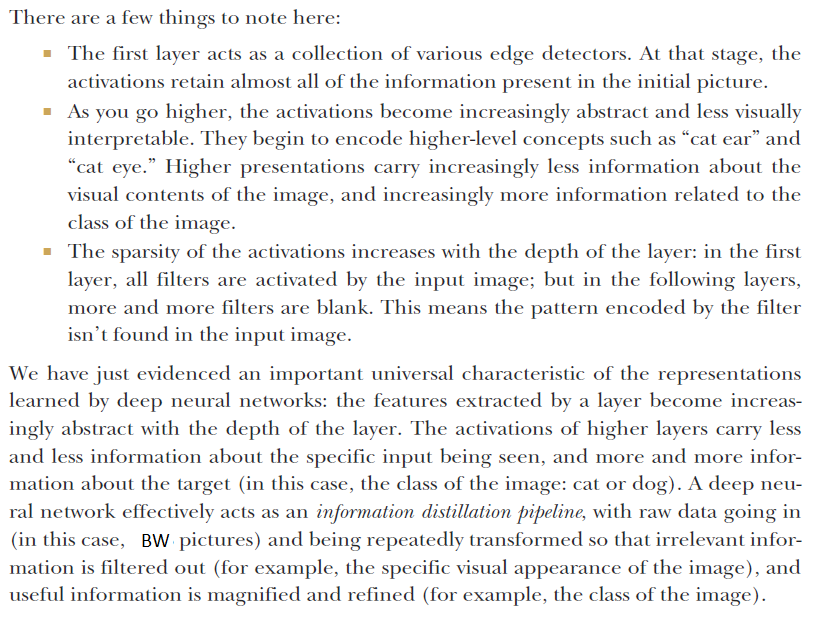

In [ ]:
maxpooling2.shape

(4, 4, 40)

In [ ]:
flattened=maxpooling2.reshape((1,4*4*40))

In [ ]:
W3.shape

(640, 100)

In [ ]:
b3.shape

(100,)

In [ ]:
hidden1=flattened@W3+b3
hidden=np.maximum(hidden1,0)#relu
output1=hidden@W4+b4
a=np.exp(output1)/np.sum(np.exp(output1))#softmax
a

array([[0., 0., 1., 0., 0., 0., 0., 0., 0., 0.]])

In [ ]:
model.predict(xk.reshape((1,28,28,1)))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


array([[0., 0., 1., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

## **CIFAR10**









The CIFAR-10 dataset [Canadian Institute For Advanced Research](https://www.cs.toronto.edu/~kriz/cifar.html) is a collection of images that are commonly used to train machine learning and computer vision algorithms. It is one of the most widely used datasets for machine learning research. The CIFAR-10 dataset contains 60,000 32x32 color images in 10 different classes. There are 6,000 images of each class.

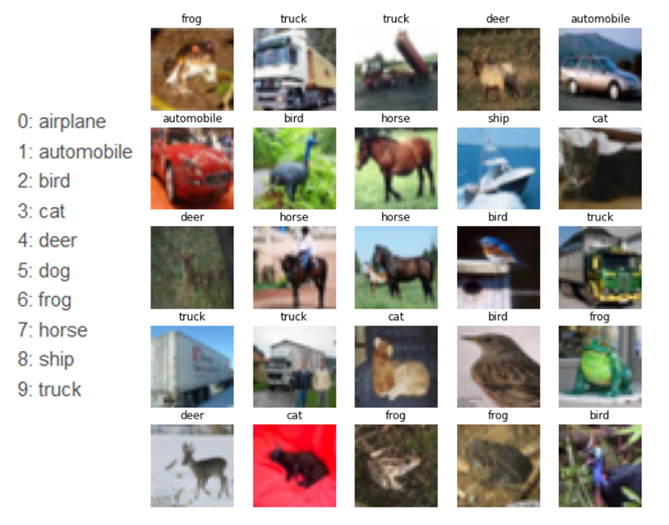

In [ ]:
from tensorflow import keras
from keras.api.datasets import cifar10
(xtrain, ytrain), (xtest, ytest) = cifar10.load_data()
xtrain = xtrain/255.0 #pixel values to 0...1, as float
xtest = xtest/255.0

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
print(xtrain.shape)
print(ytrain.shape)
print(xtest.shape)
print(ytest.shape)


(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


In [ ]:
ytrain=ytrain.reshape(50000) #to 1D-array
ytest=ytest.reshape(10000) #to 1D-array

In [ ]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

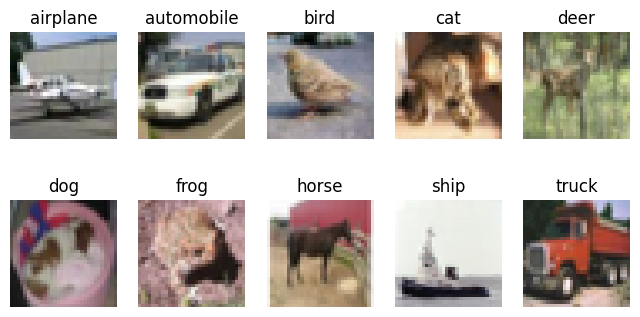

In [ ]:
#example images

plt.figure(figsize=(8,4))
for i in range(10):
    xi=xtrain[ytrain==i]
    mi=ytrain[ytrain==i].shape
    ki=np.random.randint(mi)
    plt.subplot(2,5,i+1)
    plt.axis('off')
    plt.imshow(xi[ki[0]])
    plt.title(class_names[i])
plt.show()

CNN to classify Cifar10-images

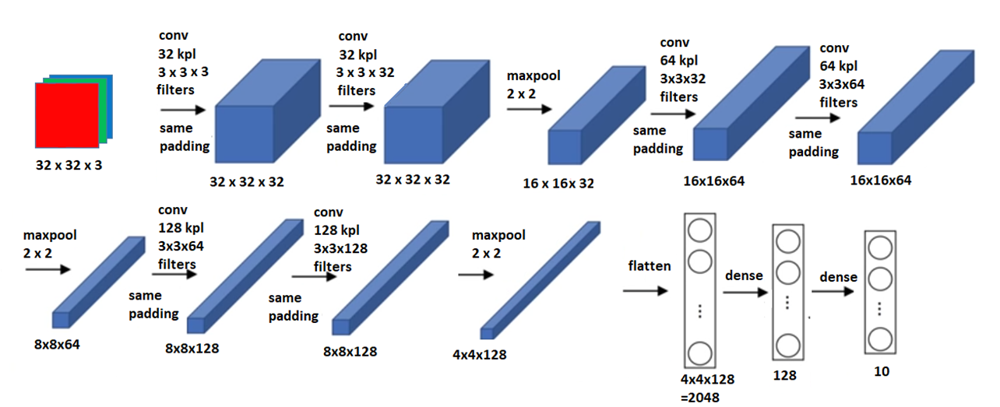

In [ ]:
from keras.api.models import Sequential
from keras.api.layers import Input, Conv2D, MaxPooling2D, Dense, Dropout, Flatten
from keras.api.optimizers import Adam

In [ ]:
model = Sequential()
model.add(Input(shape=(32,32,3)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.3))
model.add(Conv2D(64, (3, 3), activation='relu',  padding='same'))
model.add(Conv2D(64, (3, 3), activation='relu',  padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.3))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(10, activation='softmax'))
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 32, 32, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 16, 16, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 8, 8, 128)           │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 8, 8, 128)           │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           1,290 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 550,570 (2.10 MB)

 Trainable params: 550,570 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from keras.api.callbacks import ModelCheckpoint

callback = ModelCheckpoint(
    filepath='/content/drive/MyDrive/cifar10_weights.weights.h5',
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1)

In [ ]:
history = model.fit(xtrain, ytrain, epochs=120, batch_size=1000,
                    callbacks=[callback],
                    validation_data=(xtest, ytest))

Epoch 1/120
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.1486 - loss: 2.2227
Epoch 1: val_accuracy improved from -inf to 0.34970, saving model to cifar10_weights.weights.h5
50/50 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - accuracy: 0.1496 - loss: 2.2205 - val_accuracy: 0.3497 - val_loss: 1.8406
Epoch 2/120
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.3259 - loss: 1.8429
Epoch 2: val_accuracy improved from 0.34970 to 0.40640, saving model to cifar10_weights.weights.h5
50/50 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - accuracy: 0.3262 - loss: 1.8419 - val_accuracy: 0.4064 - val_loss: 1.6031
Epoch 3/120
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.3872 - loss: 1.6604
Epoch 3: val_accuracy improved from 0.40640 to 0.46960, saving model to cifar10_weights.weights.h5
50/50 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - accuracy: 0.3876 - loss: 1.6595 - val_accuracy: 0.4696 - val_loss: 1.4175
Epoch 4/120
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.4521 - loss: 1.4874
Epoch 4: val

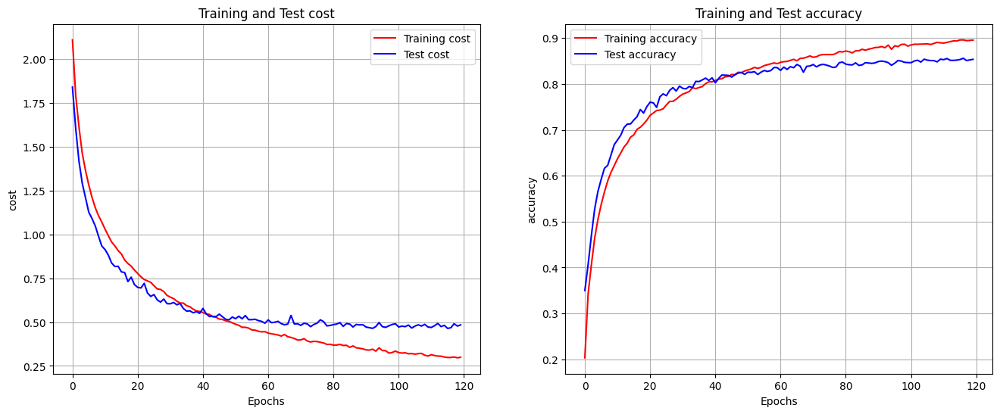

In [ ]:
train_cost = history.history['loss']
test_cost = history.history['val_loss']
train_acc = history.history['accuracy']
test_acc = history.history['val_accuracy']


plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.plot(train_cost, 'r', label='Training cost')
plt.plot(test_cost, 'b', label='Test cost')
plt.title('Training and Test cost')
plt.xlabel('Epochs')
plt.ylabel('cost')
plt.legend()
plt.grid()

plt.subplot(1,2,2)
plt.plot(train_acc, 'r', label='Training accuracy')
plt.plot(test_acc, 'b', label='Test accuracy')
plt.title('Training and Test accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.grid()
plt.show()

In [ ]:
#load best coefficients
model.load_weights('/content/drive/MyDrive/cifar10_weights.weights.h5')

train_loss,train_acc=model.evaluate(xtrain,ytrain,verbose=0)
test_loss,test_acc=model.evaluate(xtest,ytest,verbose=0)
print(train_acc)
print(test_acc)

0.9784200191497803
0.8561000227928162


In [ ]:
#save the model
model.save('/content/drive/MyDrive/cifar10_cnn.keras')

In [ ]:
#load later
from keras.api.models import load_model
model=load_model('/content/drive/MyDrive/cifar10_cnn.keras')
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 32, 32, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 16, 16, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 8, 8, 128)           │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 8, 8, 128)           │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           1,290 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,651,712 (6.30 MB)

 Trainable params: 550,570 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,101,142 (4.20 MB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


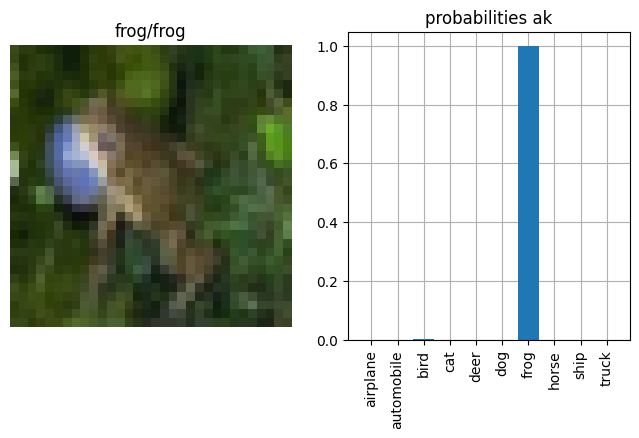

In [ ]:
#test image
k=np.random.randint(10000)
xt=xtest[k]
yt=ytest[k]
class_t=class_names[yt]
at=model.predict(xt.reshape(1,32,32,3))
ytp=np.argmax(at)
pred_class_t=class_names[ytp]

plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(xt)
plt.axis('off')
plt.title(str(class_t)+ '/' +str(pred_class_t) )
plt.subplot(1,2,2)
plt.bar(np.linspace(0,9,10),at[0,:],zorder=2)
plt.xticks(np.linspace(0,9,10),labels=class_names,rotation=90)
plt.grid()
plt.title('probabilities ak')
plt.show()

In [ ]:
atest=model.predict(xtest) #probabilities
print(atest.shape,'\n')
ytest_pred=np.argmax(atest,axis=1) #classes
print(ytest_pred.shape,'\n')
from sklearn.metrics import confusion_matrix
M=confusion_matrix(ytest, ytest_pred)
print(class_names,'\n')
print(M,'\n')
print(np.sum(np.diag(M)),'\n') #number of correctly classified test images

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
(10000, 10) 

(10000,) 

['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck'] 

[[878  13  25   9   9   0   8   7  34  17]
 [  6 934   1   1   1   2   6   1  11  37]
 [ 39   1 799  28  46  29  46   6   4   2]
 [ 16   2  44 678  43 111  60  27   9  10]
 [  6   1  36  21 853  14  41  26   1   1]
 [  8   2  24 118  26 775  14  30   0   3]
 [  5   1  18  17   9  11 930   4   3   2]
 [  8   1  13  23  35  29   5 881   1   4]
 [ 37  17   3   2   1   2   9   1 915  13]
 [ 18  36   3   7   1   2   4   1  10 918]] 

8561 



(1439, 32, 32, 3)
(1439,)


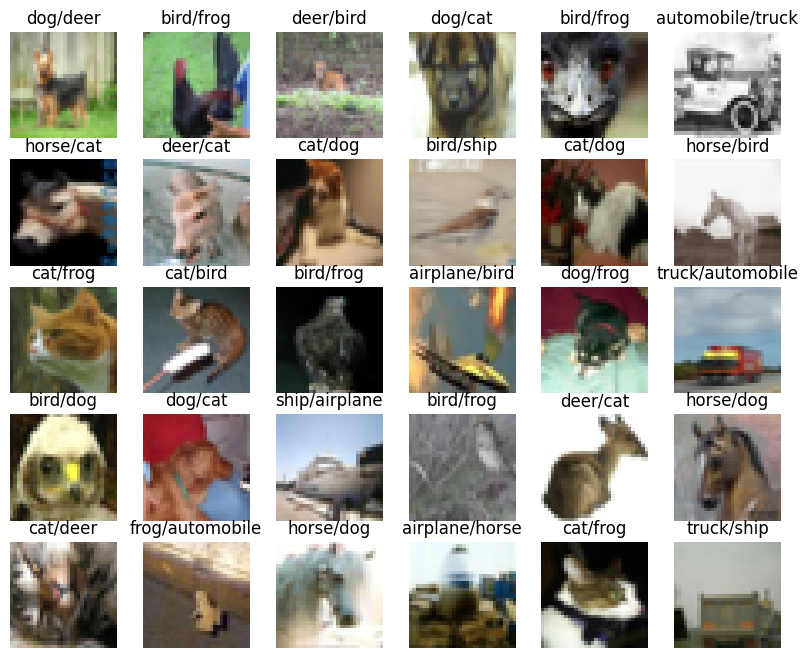

In [ ]:
#30 wrongly classified test images
xtest_wrong=xtest[ytest_pred!=ytest]
print(xtest_wrong.shape)

ytest_wrong=ytest[ytest_pred!=ytest]
ytest_wrong_pred=ytest_pred[ytest_pred!=ytest]
print(ytest_wrong.shape)
plt.figure(figsize=(10,8))
for k in range(30):
    plt.subplot(5,6,k+1)
    plt.imshow(xtest_wrong[k])
    plt.axis('off')
    plt.title(class_names[ytest_wrong[k]] + '/' + class_names[ytest_wrong_pred[k]])

## **Cats and Dogs**

Part of [Kaggles  Dogs vs. Cats dataset](https://www.kaggle.com/c/dogs-vs-cats), contains 3000 images of cats and dogs,  2000 training- and 1000 test/validation.

In [ ]:
from tensorflow import keras
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'
zip_dir = keras.utils.get_file('cats_and_dogs_filterted.zip', origin=_URL, extract=True)

68606236/68606236 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
zip_dir

'/root/.keras/datasets/cats_and_dogs_filterted.zip'

In [ ]:
#folder structure
import os
zip_dir_base = os.path.dirname(zip_dir)
!find $zip_dir_base -type d -print

/root/.keras/datasets
/root/.keras/datasets/cats_and_dogs_filtered
/root/.keras/datasets/cats_and_dogs_filtered/train
/root/.keras/datasets/cats_and_dogs_filtered/train/dogs
/root/.keras/datasets/cats_and_dogs_filtered/train/cats
/root/.keras/datasets/cats_and_dogs_filtered/validation
/root/.keras/datasets/cats_and_dogs_filtered/validation/dogs
/root/.keras/datasets/cats_and_dogs_filtered/validation/cats


In [ ]:
#name the folders
base_dir = os.path.join(os.path.dirname(zip_dir), 'cats_and_dogs_filtered')
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')
validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

In [ ]:
base_dir

'/root/.keras/datasets/cats_and_dogs_filtered'

In [ ]:
#number of images in the folders
print(len(os.listdir(train_cats_dir)))
print(len(os.listdir(train_dogs_dir)))
print(len(os.listdir(validation_cats_dir)))
print(len(os.listdir(validation_dogs_dir)))

1000
1000
500
500


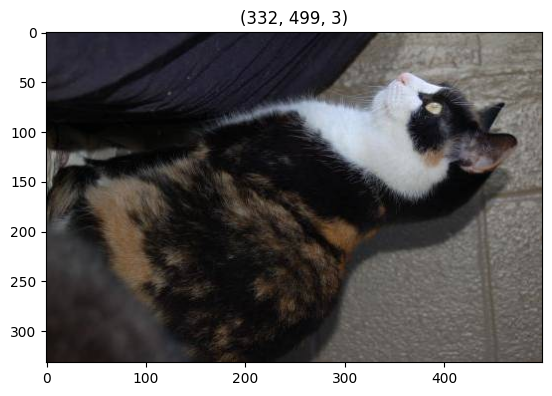

In [ ]:
#example image
dir_name=train_cats_dir
#dir_name=train_dogs_dir
fnames=os.listdir(dir_name)
mk=len(fnames)
k=np.random.randint(mk)
fname=fnames[k]
fpath=os.path.join(dir_name,fname)
image=plt.imread(fpath)
plt.imshow(image)
plt.title(image.shape)
plt.show()

### **Cats and Dogs, Data augmentation**

CNN for classification

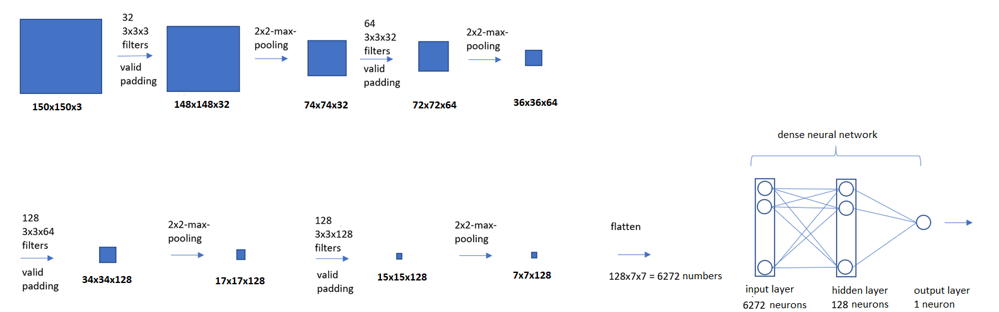

Read batches of images from folders and resize them to size (150,150,3) using [image_dataset_from_directory](https://keras.io/api/data_loading/image/)

In [ ]:
from keras.api.utils import image_dataset_from_directory

#size of images
img_height=150
img_width=150
#batch size
batch_size=32

train_dataset = image_dataset_from_directory(
    train_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size)

validation_dataset = image_dataset_from_directory(
    validation_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size)

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.


data batch shape: (32, 150, 150, 3)
labels batch shape: (32,)


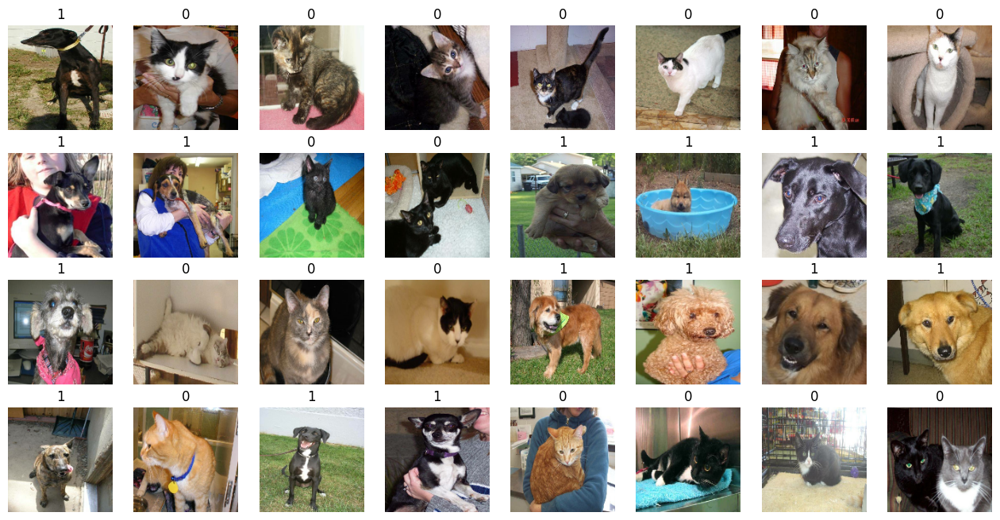

In [ ]:
#one batch of training-images
for data_batch, labels_batch in train_dataset:
  print('data batch shape:', data_batch.shape)
  print('labels batch shape:', labels_batch.shape)
  plt.figure(figsize=(16,8))
  for k in range(batch_size):
    plt.subplot(4,8,k+1)
    plt.imshow(data_batch[k]/255.0) #pixel values to 0...1
    plt.axis('off')
    plt.title(int(labels_batch[k]))
  break

In [ ]:
from keras.api.models import Sequential
from keras.api.layers import Input,Rescaling,Conv2D, MaxPooling2D, Flatten, Dropout, Dense

In [ ]:
model = Sequential()
model.add(Input(shape=(img_height,img_width,3)))
model.add(Rescaling(1/255.0)) #pixel values to 0...1
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.2))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.2))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)                │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 15, 15, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 7, 7, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         802,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,043,905 (3.98 MB)

 Trainable params: 1,043,905 (3.98 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from keras.api.optimizers import Adam
model.compile(loss='binary_crossentropy',
              optimizer=Adam(learning_rate=0.001),
              metrics=['accuracy'])

In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
from keras.api.callbacks import ModelCheckpoint

callback = ModelCheckpoint(filepath='/content/drive/MyDrive/cats_and_dogs_v1.weights.h5',
                               monitor='val_accuracy',
                               save_weights_only=True,
                               save_best_only=True,
                               verbose=1)

In [ ]:
history = model.fit(
      train_dataset,
      epochs=30,
      validation_data=validation_dataset,
      callbacks=[callback])

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - accuracy: 0.4851 - loss: 0.7245
Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to cats_and_dogs_v1.weights.h5
63/63 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - accuracy: 0.4851 - loss: 0.7241 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 2/30
61/63 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.4810 - loss: 0.6940
Epoch 2: val_accuracy did not improve from 0.50000
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - accuracy: 0.4818 - loss: 0.6940 - val_accuracy: 0.5000 - val_loss: 0.6927
Epoch 3/30
61/63 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5099 - loss: 0.6932
Epoch 3: val_accuracy did not improve from 0.50000
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.5093 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6922
Epoch 4/30
62/63 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5205 - loss: 0.6892
Epoch 4: val_accuracy improved from 0.50000 to 0.56800, saving model to cats_and_dogs_v1.weights.h5
63/63 ━━━━

In [ ]:
model.load_weights('/content/drive/MyDrive/cats_and_dogs_v1.weights.h5')

print(model.evaluate(train_dataset,verbose=0))
print(model.evaluate(validation_dataset,verbose=0))

[0.11012040078639984, 0.9735000133514404]
[0.5941152572631836, 0.7889999747276306]


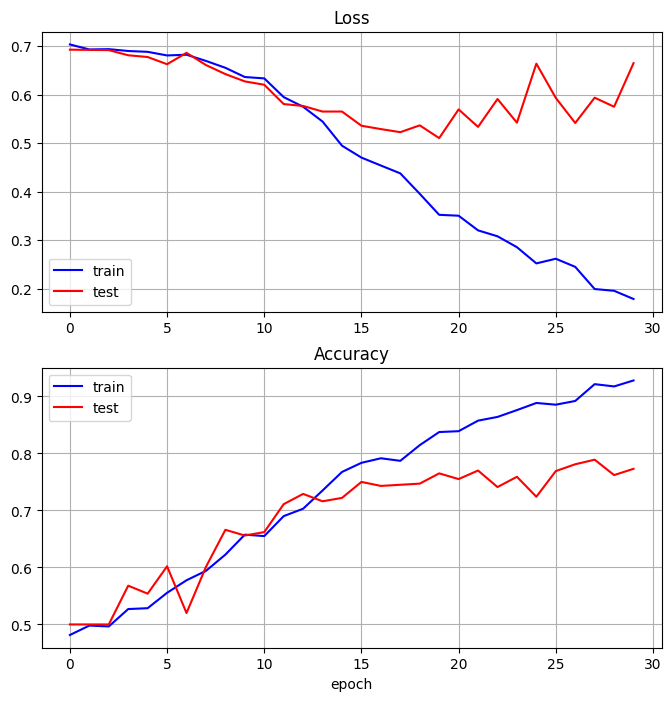

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Loss')
plt.plot(history.history['loss'], color='b', label='train')
plt.plot(history.history['val_loss'], color='r', label='test')
plt.legend()
plt.grid()
plt.subplot(2,1,2)
plt.title('Accuracy')
plt.plot(history.history['accuracy'], color='b', label='train')
plt.plot(history.history['val_accuracy'], color='r', label='test')
plt.legend()
plt.grid()
plt.xlabel('epoch')
plt.show()

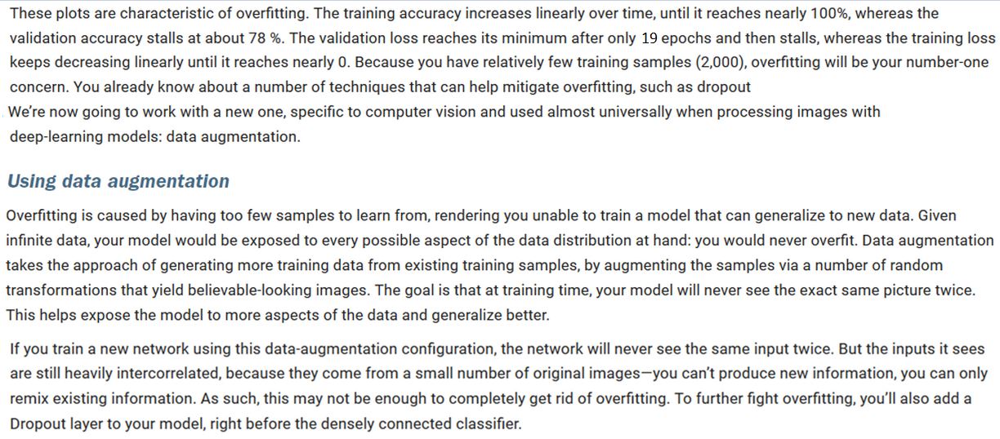

[data-augmentations available in Keras](https://keras.io/api/layers/preprocessing_layers/image_augmentation/)





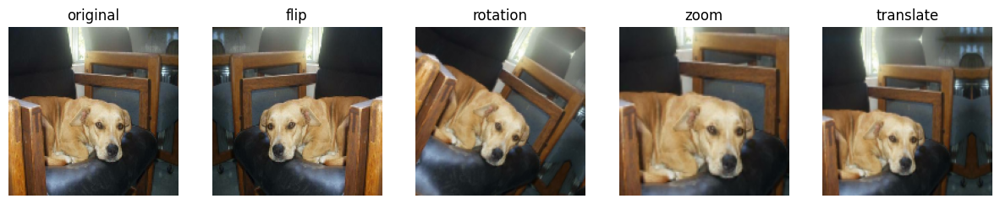

In [ ]:
from keras.api.layers import RandomFlip, RandomRotation,RandomZoom, RandomTranslation
flip=RandomFlip('horizontal') #flip horizontally (with 50 % probability)
rotate=RandomRotation(0.1) #rotate with random angle -0.1...0.1 *360 degrees
zoom=RandomZoom(0.3) #zoom with random factor -0.3...0.3
translate=RandomTranslation(height_factor=0.2, width_factor=0.2)#translate with random amount -20%...+20% vertically and horizontally

for data_batch, labels_batch in train_dataset:
  image=data_batch[0]/255.0 #pixel values 0...1
  flipped=flip(image)
  rotated=rotate(image)
  zoomed=zoom(image)
  translated=translate(image)

  plt.figure(figsize=(15,3))
  plt.subplot(1,5,1)
  plt.imshow(image)
  plt.axis('off')
  plt.title('original')
  plt.subplot(1,5,2)
  plt.imshow(flipped)
  plt.axis('off')
  plt.title('flip')
  plt.subplot(1,5,3)
  plt.imshow(rotated)
  plt.axis('off')
  plt.title('rotation')
  plt.subplot(1,5,4)
  plt.imshow(zoomed)
  plt.axis('off')
  plt.title('zoom')
  plt.subplot(1,5,5)
  plt.imshow(translated)
  plt.axis('off')
  plt.title('translate')
  break


In [ ]:
#layer for data-augmentation
from keras.api.models import Sequential
Data_augmentation = Sequential([
        RandomFlip("horizontal"),
        RandomRotation(0.1),
        RandomZoom(0.2),
        RandomTranslation(0.2,0.2)])

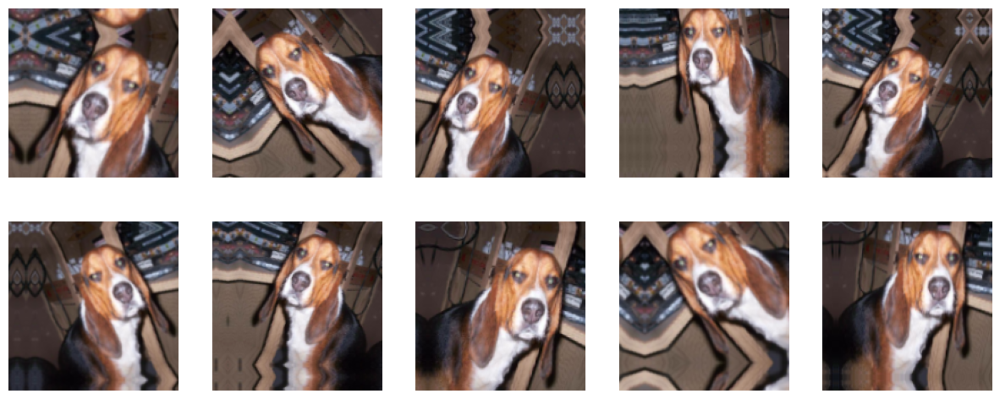

In [ ]:
#10 random augmentations for an example image
plt.figure(figsize=(15,6))
for images, labels in train_dataset:
    for i in range(10):
        augmented_images = Data_augmentation(images)
        plt.subplot(2,5,i+1)
        plt.imshow(augmented_images[0]/255.0)
        plt.axis("off")
    break

In [ ]:
#CNN with data_augmentation
model = Sequential()
model.add(Input(shape=(img_height,img_width,3)))
model.add(Data_augmentation)
model.add(Rescaling(1/255.0))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_3 (Rescaling)              │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 15, 15, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 7, 7, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │         802,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,043,905 (3.98 MB)

 Trainable params: 1,043,905 (3.98 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from keras.api.optimizers import Adam
model.compile(loss='binary_crossentropy',
              optimizer=Adam(learning_rate=0.0005),
              metrics=['accuracy'])

In [ ]:
from keras.api.callbacks import ModelCheckpoint

callback = ModelCheckpoint(filepath='/content/drive/MyDrive/cats_and_dogs_v2.weights.h5',
                               monitor='val_accuracy',
                               save_weights_only=True,
                               save_best_only=True,
                               verbose=1)

In [ ]:
history = model.fit(
      train_dataset,
      epochs=100,
      validation_data=validation_dataset,
      callbacks=[callback])

Epoch 1/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.4703 - loss: 0.7025
Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to cats_and_dogs_v2.weights.h5
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.4705 - loss: 0.7024 - val_accuracy: 0.5000 - val_loss: 0.6902
Epoch 2/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5132 - loss: 0.6911
Epoch 2: val_accuracy improved from 0.50000 to 0.52600, saving model to cats_and_dogs_v2.weights.h5
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - accuracy: 0.5133 - loss: 0.6911 - val_accuracy: 0.5260 - val_loss: 0.6804
Epoch 3/100
62/63 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5528 - loss: 0.6863
Epoch 3: val_accuracy did not improve from 0.52600
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.5525 - loss: 0.6863 - val_accuracy: 0.5140 - val_loss: 0.6710
Epoch 4/100
61/63 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5958 - loss: 0.6705
Epoch 4: val_accuracy improved from 0.52600 to 0.61400, savi

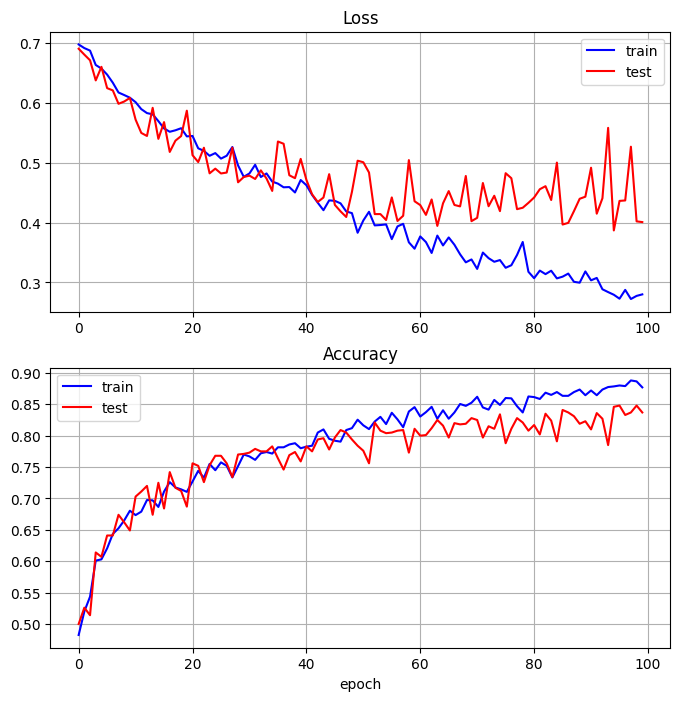

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Loss')
plt.plot(history.history['loss'], color='b', label='train')
plt.plot(history.history['val_loss'], color='r', label='test')
plt.legend()
plt.grid()

plt.subplot(2,1,2)
plt.title('Accuracy')
plt.plot(history.history['accuracy'], color='b', label='train')
plt.plot(history.history['val_accuracy'], color='r', label='test')
plt.legend()
plt.grid()
plt.xlabel('epoch')
plt.show()

In [ ]:
model.load_weights('/content/drive/MyDrive/cats_and_dogs_v2.weights.h5')

print(model.evaluate(train_dataset,verbose=0))
print(model.evaluate(validation_dataset,verbose=0))

[0.1925775706768036, 0.9204999804496765]
[0.4361973702907562, 0.8479999899864197]


In [ ]:
#save model
model.save('/content/drive/My Drive/cats_and_dogs_cnn.keras')

In [ ]:
#load later
from keras.api.models import load_model
model=load_model('/content/drive/My Drive/cats_and_dogs_cnn.keras')
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_3 (Rescaling)              │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 15, 15, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 7, 7, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │         802,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,131,717 (11.95 MB)

 Trainable params: 1,043,905 (3.98 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,087,812 (7.96 MB)

In [ ]:
print(model.evaluate(train_dataset,verbose=0))
print(model.evaluate(validation_dataset,verbose=0))

[0.1925775706768036, 0.9204999804496765]
[0.4361973702907562, 0.8479999899864197]


[[0.53]]


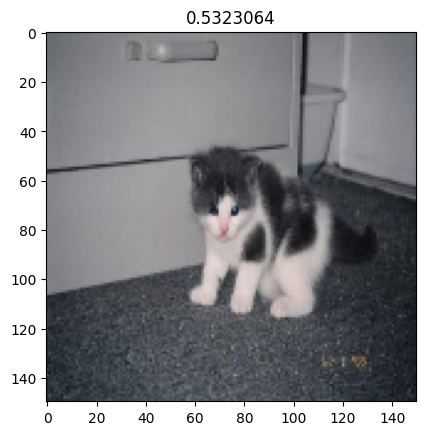

In [ ]:
#prediction for example image
img_height=150
img_width=150
import cv2
dir_name=validation_dogs_dir
dir_name=validation_cats_dir
fnames=os.listdir(dir_name)
mdir=len(fnames)
k=np.random.randint(mdir)
fname=fnames[k]
fpath = os.path.join(dir_name,fname)
image = plt.imread(fpath)
image_rs = cv2.resize(image,(img_height,img_width)) #to size (150,150,3)
pred=model.predict(image_rs.reshape((1,150,150,3)),verbose=0)
print(pred)
plt.imshow(image_rs)
plt.title(pred[0,0])
plt.show()

In [ ]:
model.weights

[<KerasVariable shape=(3, 3, 3, 32), dtype=float32, path=conv2d_12/kernel>,
 <KerasVariable shape=(32,), dtype=float32, path=conv2d_12/bias>,
 <KerasVariable shape=(3, 3, 32, 64), dtype=float32, path=conv2d_13/kernel>,
 <KerasVariable shape=(64,), dtype=float32, path=conv2d_13/bias>,
 <KerasVariable shape=(3, 3, 64, 128), dtype=float32, path=conv2d_14/kernel>,
 <KerasVariable shape=(128,), dtype=float32, path=conv2d_14/bias>,
 <KerasVariable shape=(3, 3, 128, 128), dtype=float32, path=conv2d_15/kernel>,
 <KerasVariable shape=(128,), dtype=float32, path=conv2d_15/bias>,
 <KerasVariable shape=(6272, 128), dtype=float32, path=dense_6/kernel>,
 <KerasVariable shape=(128,), dtype=float32, path=dense_6/bias>,
 <KerasVariable shape=(128, 1), dtype=float32, path=dense_7/kernel>,
 <KerasVariable shape=(1,), dtype=float32, path=dense_7/bias>]

In [ ]:
W1=np.array(model.weights[0])
b1=np.array(model.weights[1])
W2=np.array(model.weights[2])
b2=np.array(model.weights[3])
W3=np.array(model.weights[4])
b3=np.array(model.weights[5])
W4=np.array(model.weights[6])
b4=np.array(model.weights[7])
W5=np.array(model.weights[8])
b5=np.array(model.weights[9])
W6=np.array(model.weights[10])
b6=np.array(model.weights[11])

In [ ]:
W1.shape

(3, 3, 3, 32)

In [ ]:
np.set_printoptions(precision=3)
k=0
print(W1[:,:,:,k])

[[[ 0.004 -0.01   0.077]
  [-0.023  0.162  0.083]
  [ 0.203  0.083  0.025]]

 [[-0.056 -0.044  0.021]
  [ 0.063 -0.151  0.138]
  [ 0.1   -0.003  0.012]]

 [[-0.118 -0.146 -0.115]
  [-0.081 -0.172 -0.01 ]
  [ 0.139 -0.171 -0.079]]]


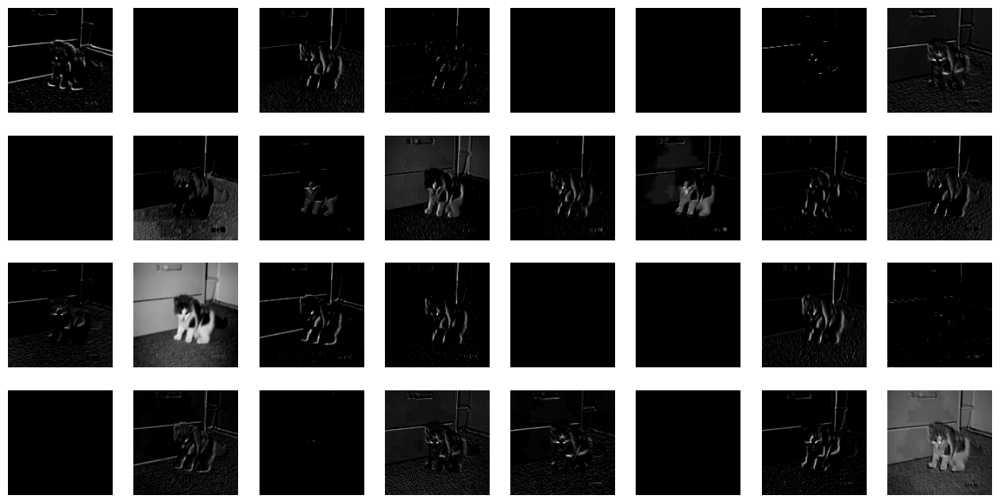

In [ ]:
#convolution1
xk=image_rs/255.0
n=3
conv1=np.zeros((148,148,32))
plt.figure(figsize=(16,8))
for m in range(32):
  #filter/kernel, nxn-matrix
  f=W1[:,:,:,m]
  #convolution of xk and f
  for r in range(150-n+1):
    for s in range(150-n+1):
      conv1_rs=np.sum(xk[r:r+n,s:s+n,:]*f)+b1[m]
      conv1[r,s,m]=np.maximum(conv1_rs,0) #relu

  plt.subplot(4,8,m+1)
  plt.imshow(conv1[:,:,m],cmap='gray')
  plt.xlim([-0.5,147.5])
  plt.ylim([147.5,-0.5])
  plt.axis('off')


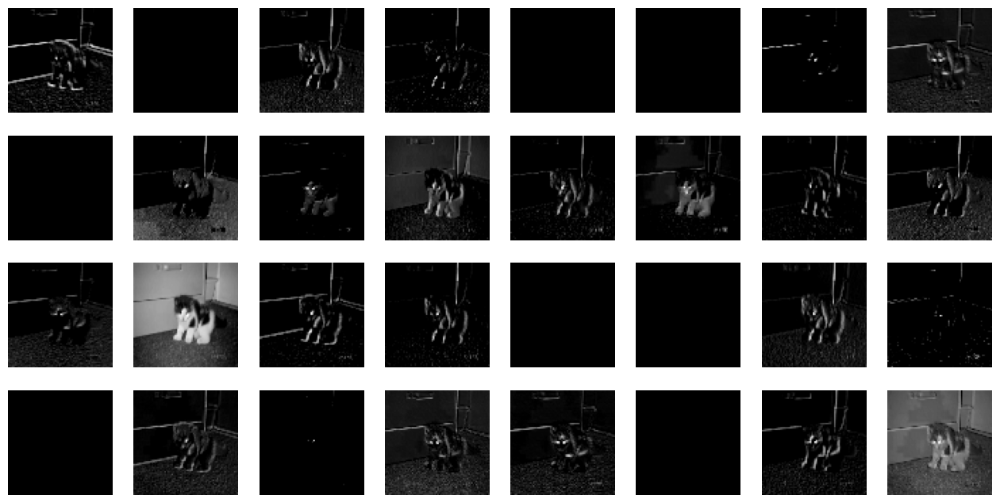

In [ ]:
#maxpooling1
maxpooling1=np.zeros((74,74,32))
plt.figure(figsize=(16,8))

for m in range(32):
  M=conv1[:,:,m]
  for r in range(74):
    for s in range(74):
      maxpooling1[r,s,m]=np.max(M[2*r:2*r+2,2*s:2*s+2])
  plt.subplot(4,8,m+1)
  plt.imshow(maxpooling1[:,:,m],cmap='gray')
  plt.xlim([-0.5,73.5])
  plt.ylim([73.5,-0.5])
  plt.axis('off')

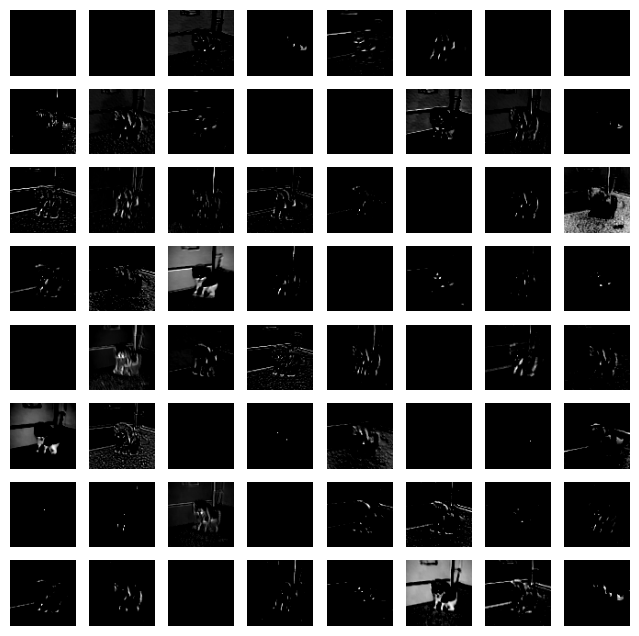

In [ ]:
#convolution2
n=3
conv2=np.zeros((72,72,64))
plt.figure(figsize=(8,8))
for m in range(64):
  #filter/kernel, nxn-matrix
  f=W2[:,:,:,m]
  #convolution of xk and f
  for r in range(74-n+1):
    for s in range(74-n+1):
      conv2_rs=np.sum(maxpooling1[r:r+n,s:s+n,:]*f)+b2[m]
      conv2[r,s,m]=np.maximum(conv2_rs,0) #relu
  plt.subplot(8,8,m+1)
  plt.imshow(conv2[:,:,m],cmap='gray')
  plt.xlim([-0.5,71.5])
  plt.ylim([71.5,-0.5])
  plt.axis('off')


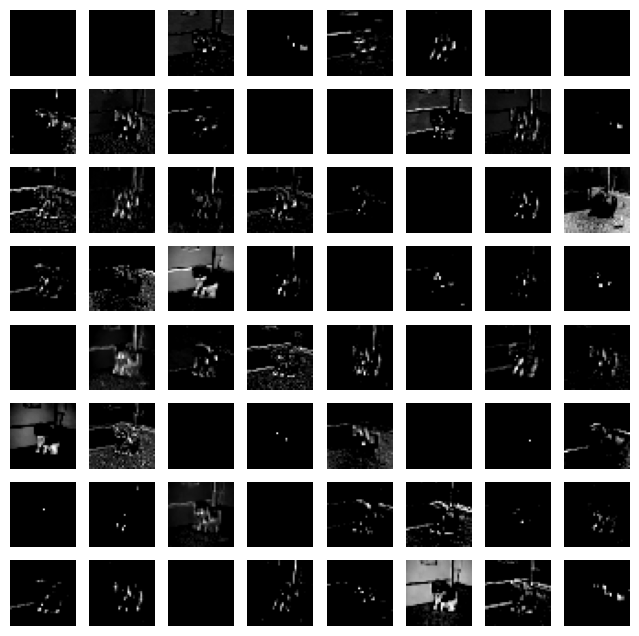

In [ ]:
#maxpooling2
maxpooling2=np.zeros((36,36,64))
plt.figure(figsize=(8,8))
for m in range(64):
  M=conv2[:,:,m]
  for r in range(36):
    for s in range(36):
      maxpooling2[r,s,m]=np.max(M[2*r:2*r+2,2*s:2*s+2])
  plt.subplot(8,8,m+1)
  plt.imshow(maxpooling2[:,:,m],cmap='gray')
  plt.xlim([-0.5,35.5])
  plt.ylim([35.5,-0.5])
  plt.axis('off')

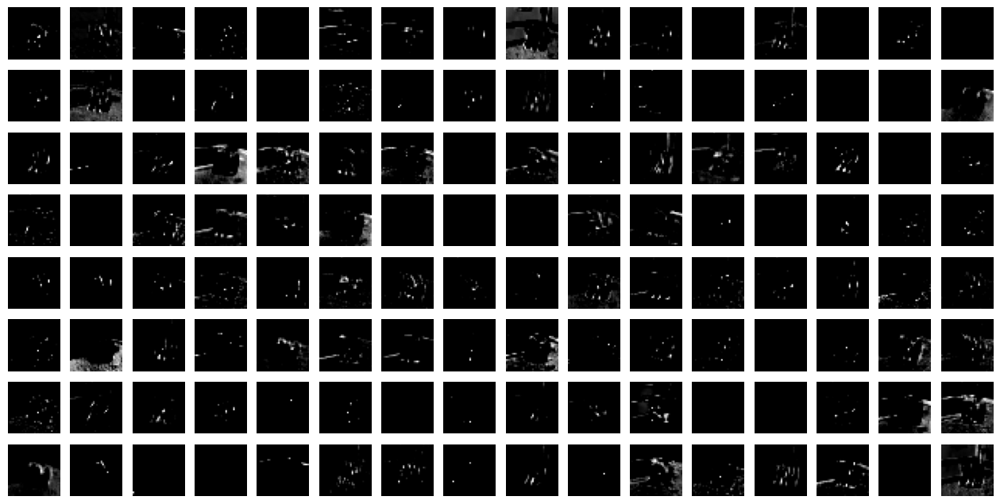

In [ ]:
#convolution3
n=3
conv3=np.zeros((34,34,128))
plt.figure(figsize=(16,8))
for m in range(128):
  #filter/kernel, nxn-matrix
  f=W3[:,:,:,m]
  #convolution of xk and f
  for r in range(36-n+1):
    for s in range(36-n+1):
      conv3_rs=np.sum(maxpooling2[r:r+n,s:s+n,:]*f)+b3[m]
      conv3[r,s,m]=np.maximum(conv3_rs,0) #relu
  plt.subplot(8,16,m+1)
  plt.imshow(conv3[:,:,m],cmap='gray')
  plt.xlim([-0.5,33.5])
  plt.ylim([33.5,-0.5])
  plt.axis('off')


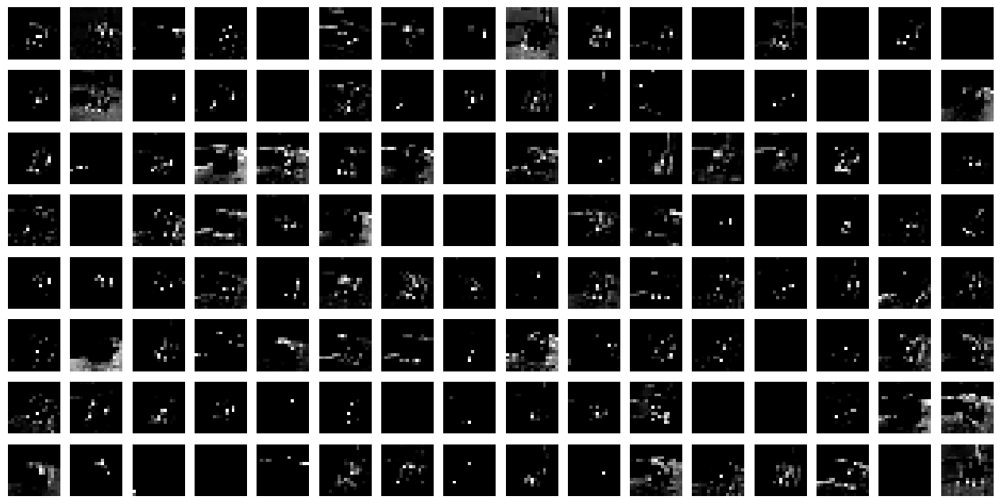

In [ ]:
#maxpooling3
maxpooling3=np.zeros((17,17,128))
plt.figure(figsize=(16,8))
for m in range(128):
  M=conv3[:,:,m]
  for r in range(17):
    for s in range(17):
      maxpooling3[r,s,m]=np.max(M[2*r:2*r+2,2*s:2*s+2])
  plt.subplot(8,16,m+1)
  plt.imshow(maxpooling3[:,:,m],cmap='gray')
  plt.xlim([-0.5,16.5])
  plt.ylim([16.5,-0.5])
  plt.axis('off')

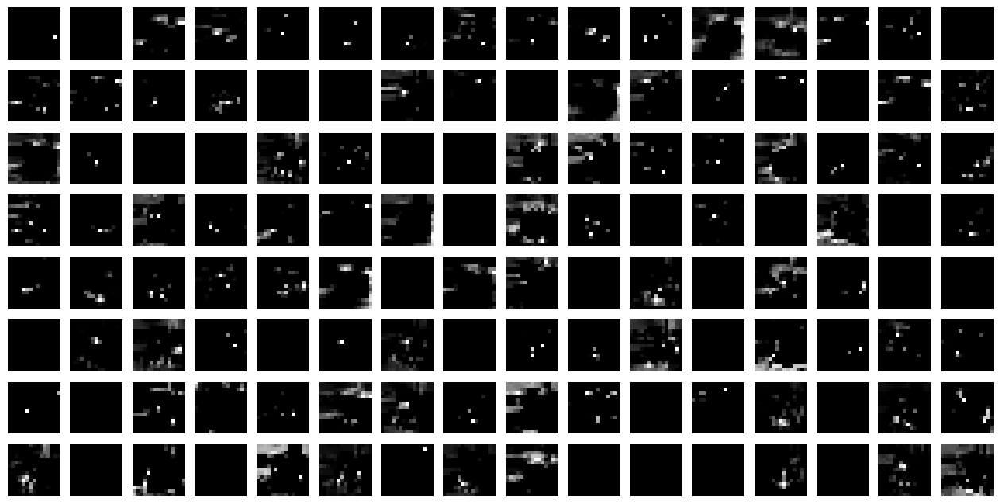

In [ ]:
#convolution4
n=3
conv4=np.zeros((15,15,128))
plt.figure(figsize=(16,8))
for m in range(128):
  #filter/kernel, nxn-matrix
  f=W4[:,:,:,m]
  #convolution of xk and f
  for r in range(17-n+1):
    for s in range(17-n+1):
      conv4_rs=np.sum(maxpooling3[r:r+n,s:s+n,:]*f)+b4[m]
      conv4[r,s,m]=np.maximum(conv4_rs,0) #relu
  plt.subplot(8,16,m+1)
  plt.imshow(conv4[:,:,m],cmap='gray')
  plt.xlim([-0.5,14.5])
  plt.ylim([14.5,-0.5])
  plt.axis('off')


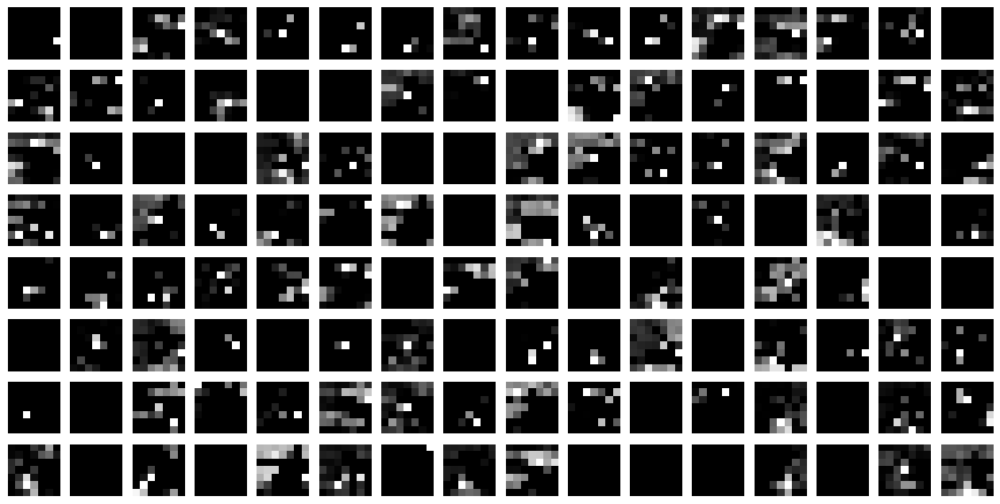

In [ ]:
#maxpooling4
maxpooling4=np.zeros((7,7,128))
plt.figure(figsize=(16,8))
for m in range(128):
  M=conv4[:,:,m]
  for r in range(7):
    for s in range(7):
      maxpooling4[r,s,m]=np.max(M[2*r:2*r+2,2*s:2*s+2])
  plt.subplot(8,16,m+1)
  plt.imshow(maxpooling4[:,:,m],cmap='gray')
  plt.xlim([-0.5,6.5])
  plt.ylim([6.5,-0.5])
  plt.axis('off')

In [ ]:
maxpooling4.shape

(7, 7, 128)

In [ ]:
flattened=maxpooling4.reshape((1,7*7*128))

In [ ]:
hidden1=flattened@W5+b5
hidden=np.maximum(hidden1,0)#relu
output1=hidden@W6+b6
a=1/(1+np.exp(-output1))#sigmoid
a

array([[0.53]])

In [ ]:
model.predict(image_rs.reshape((1,150,150,3)))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


array([[0.53]], dtype=float32)

### **Cats and Dogs, Pretrained convnet**

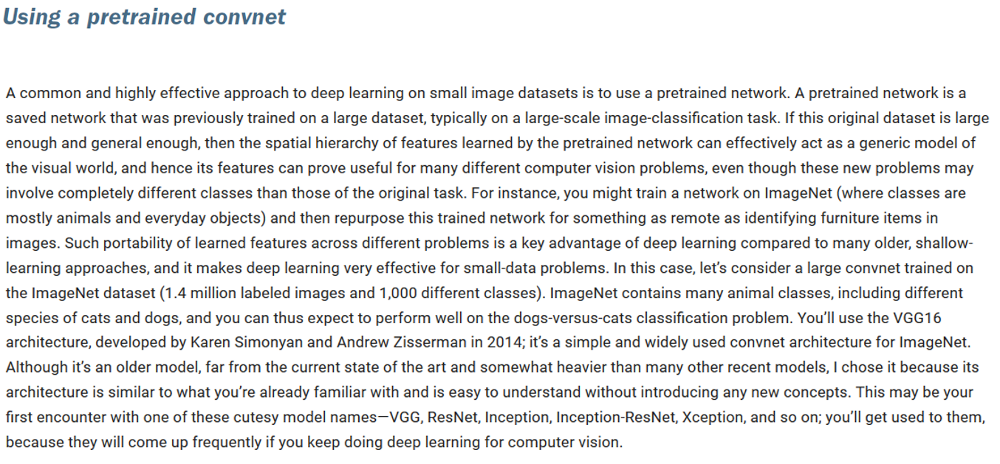



Large pretrained convnet [VGG16](https://medium.com/@mygreatlearning/everything-you-need-to-know-about-vgg16-7315defb5918).

VGG16 contains 13 convolutional-, 5 max-pool and 3 dense layers, with  140 million coefficients.

It has been trained to classify an image to 1000 classes  using   [ImageNet-dataset](https://www.image-net.org/) with  1.4 million images.





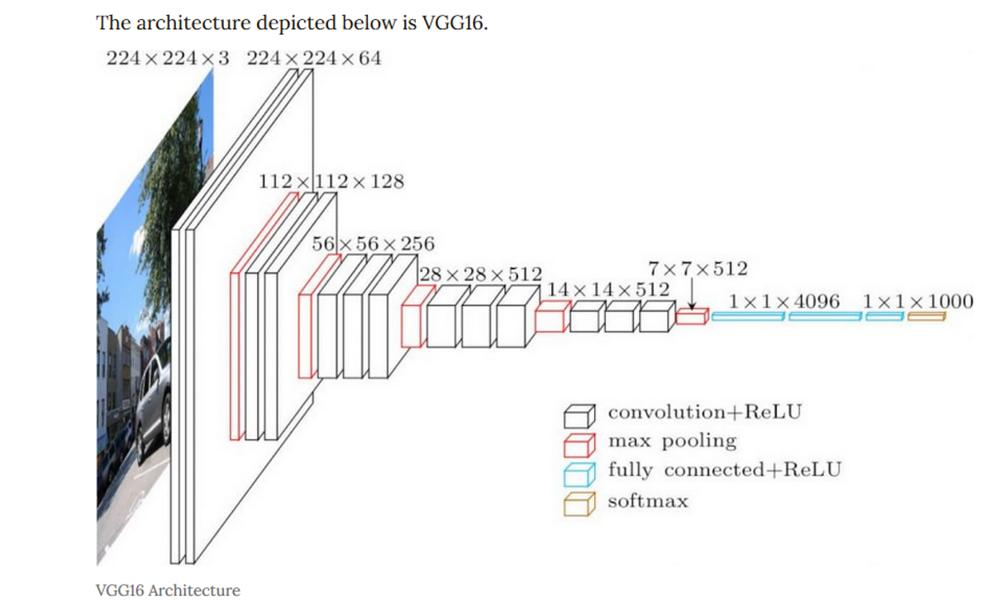

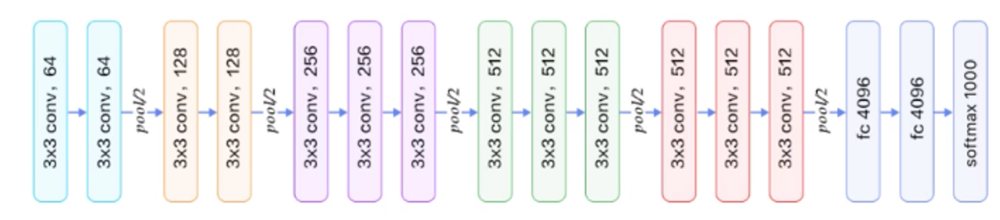

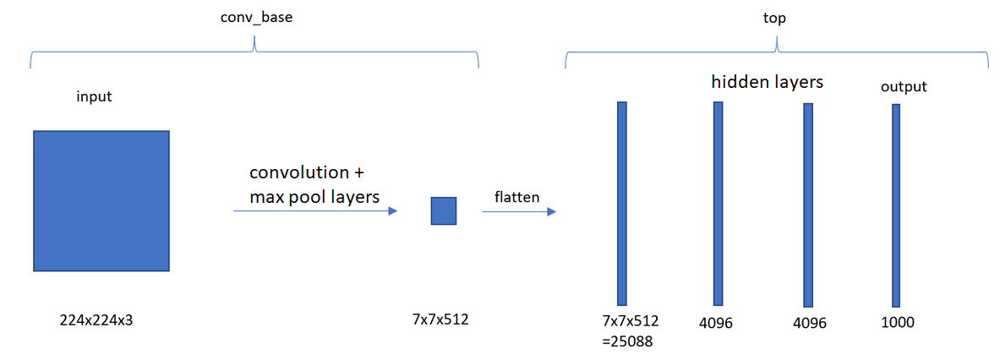

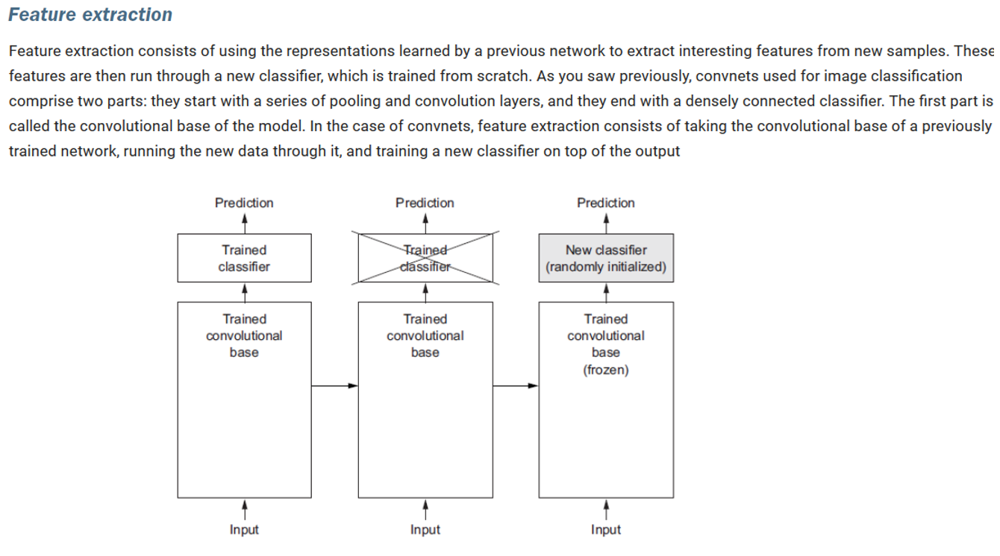

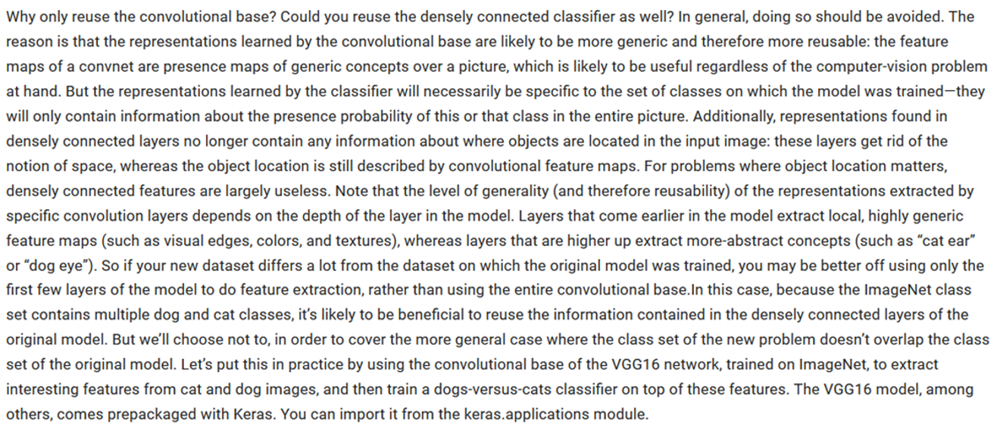

In [ ]:
from keras.api.applications import VGG16

In [ ]:
model = VGG16(include_top=True,weights='imagenet')

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step


In [ ]:
model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#convolutional layers
conv_base = VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3))
conv_base.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from keras.api.applications.vgg16 import decode_predictions, preprocess_input

#preprocess_input = subtract the mean RGB value, computed on the training set, from each pixel.

35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


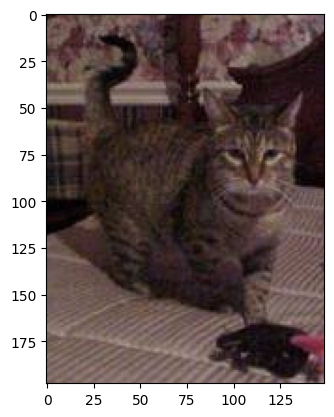

(1, 1000)
[('n02124075', 'Egyptian_cat', 0.28602222), ('n02123045', 'tabby', 0.20273794), ('n02127052', 'lynx', 0.15184152), ('n02123159', 'tiger_cat', 0.12872915), ('n03598930', 'jigsaw_puzzle', 0.017626619), ('n04033995', 'quilt', 0.013963127), ('n04265275', 'space_heater', 0.010623909), ('n03388549', 'four-poster', 0.009047225), ('n06785654', 'crossword_puzzle', 0.008823844), ('n03998194', 'prayer_rug', 0.0076984144)]
('n02124075', 'Egyptian_cat', 0.28602222)
Egyptian_cat
0.28602222


In [ ]:
#VGG16 prediction to an example image
import cv2
dir_name=validation_cats_dir
fnames=os.listdir(dir_name)
N=len(fnames)
k=np.random.randint(N)
fpath = os.path.join(dir_name,fnames[k])
image = plt.imread(fpath)
image_rs = cv2.resize(image,(224,224)) # -> (224,224,3)
image_pp = preprocess_input(image_rs)
pred=model.predict(image_pp.reshape((1,224,224,3)),verbose=0) #1000 probabilities
label = decode_predictions(pred,top=10)[0] #10 largest probabilities and corresponding classes

plt.imshow(image)
plt.show()

print(pred.shape)
print(label)
print(label[0])
print(label[0][1])
print(label[0][2])




####**Feature extraction**

Calculate the outputs of cats and dogs images from the convolutional layers of VGG16 (conv_base), use these 25088 numbers as coordinates of the images (extracted features), and train a dense neural net to classify cats and dogs.





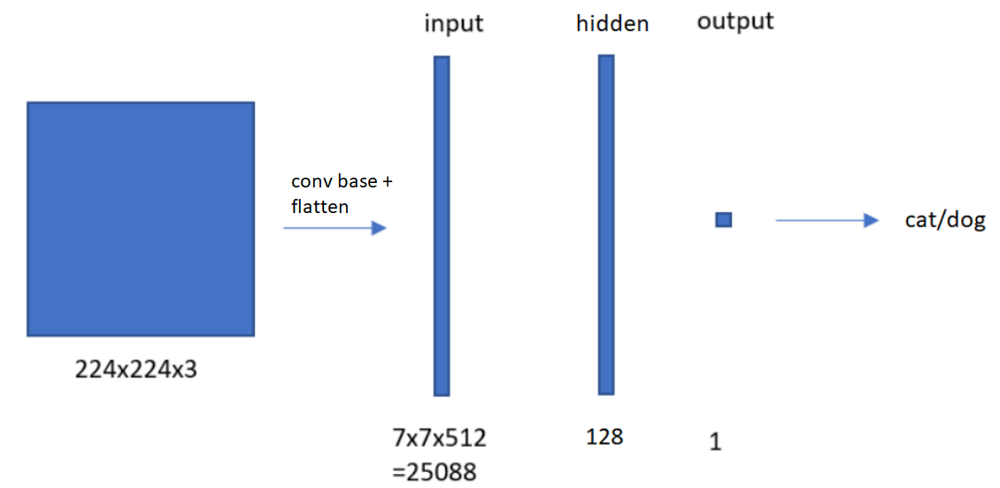

In [ ]:
#read batches of images from folders to size 224x224
from keras.api.utils import image_dataset_from_directory

#image size
img_height=224
img_width=224
#batch size
batch_size=20

train_dataset = image_dataset_from_directory(
    train_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size)

validation_dataset = image_dataset_from_directory(
    validation_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size,
    shuffle=False)

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.


In [ ]:
#calculate the 7*7*512=25088 coordinates of train- and test-images from the convolutional layers of VGG16
train_features=np.zeros((2000,7*7*512))
train_labels=np.zeros(2000)
test_features=np.zeros((1000,7*7*512))
test_labels=np.zeros(1000)
i=0
for images,labels in train_dataset:
  preprocessed_images = preprocess_input(images)
  features = conv_base.predict(preprocessed_images,verbose=0)
  train_features[i*batch_size:(i+1)*batch_size,:]=features.reshape((batch_size,7*7*512))
  train_labels[i*batch_size:(i+1)*batch_size]=labels
  i+=1
  if i==100: #100*20=2000 training-images
    break

i=0
for images,labels in validation_dataset:
  preprocessed_images = preprocess_input(images)
  features = conv_base.predict(preprocessed_images,verbose=0)
  test_features[i*batch_size:(i+1)*batch_size,:]=features.reshape((batch_size,7*7*512))
  test_labels[i*batch_size:(i+1)*batch_size]=labels
  i+=1
  if i==50: #50*20=1000 test-images
    break


In [ ]:
#dense neural net for classification
from keras.api.models import Sequential
from keras.api.layers import Input, Dense, Dropout

model = Sequential()
model.add(Input(shape=(25088,)))
model.add(Dropout(rate=0.5))
model.add(Dense(128,activation='relu'))
model.add(Dropout(rate=0.5))
model.add(Dense(1,activation='sigmoid'))
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dropout_2 (Dropout)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,211,521 (12.25 MB)

 Trainable params: 3,211,521 (12.25 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from keras.api.optimizers import Adam
model.compile(loss='binary_crossentropy',
              optimizer=Adam(learning_rate=0.0005),
              metrics=['accuracy'])

In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
from keras.api.callbacks import ModelCheckpoint

callback = ModelCheckpoint(filepath='/content/drive/MyDrive/cats_and_dogs_VGG16_v1.weights.h5',
                               monitor='val_accuracy',
                               save_weights_only=True,
                               save_best_only=True,
                               verbose=1)

In [ ]:
history = model.fit(
      train_features,train_labels,
      batch_size=50,
      epochs=100,
      validation_data=(test_features,test_labels),
      callbacks=[callback])

Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8615 - loss: 3.1032
Epoch 1: val_accuracy improved from -inf to 0.97500, saving model to cats_and_dogs_VGG16_v1.weights.h5
40/40 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.8629 - loss: 3.0686 - val_accuracy: 0.9750 - val_loss: 0.3666
Epoch 2/100
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9746 - loss: 0.2562
Epoch 2: val_accuracy did not improve from 0.97500
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9752 - loss: 0.2565 - val_accuracy: 0.9690 - val_loss: 0.3015
Epoch 3/100
28/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9723 - loss: 0.2533
Epoch 3: val_accuracy improved from 0.97500 to 0.98200, saving model to cats_and_dogs_VGG16_v1.weights.h5
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9748 - loss: 0.2390 - val_accuracy: 0.9820 - val_loss: 0.1667
Epoch 4/100
35/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9894 - loss: 0.1045
Epoch 4: val_accuracy improved from 0.98200 to 0.98500

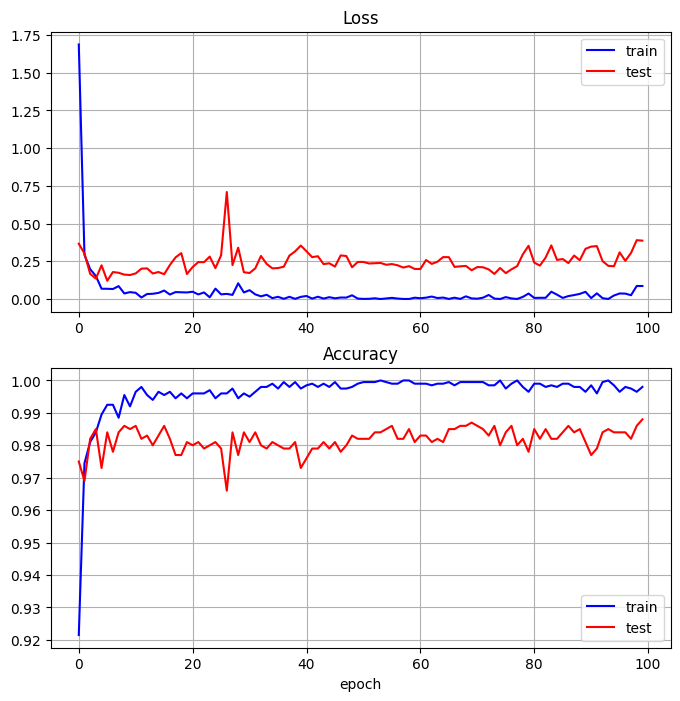

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Loss')
plt.plot(history.history['loss'], color='b', label='train')
plt.plot(history.history['val_loss'], color='r', label='test')
plt.legend()
plt.grid()

plt.subplot(2,1,2)
plt.title('Accuracy')
plt.plot(history.history['accuracy'], color='b', label='train')
plt.plot(history.history['val_accuracy'], color='r', label='test')
plt.legend()
plt.grid()
plt.xlabel('epoch')
plt.show()

In [ ]:
model.load_weights('/content/drive/MyDrive/cats_and_dogs_VGG16_v1.weights.h5')

print(model.evaluate(train_features,train_labels,verbose=0))
print(model.evaluate(test_features,test_labels,verbose=0))

[2.7763281582569854e-13, 1.0]
[0.3867724537849426, 0.9879999756813049]


In [ ]:
#save model
model.save('/content/drive/My Drive/cats_and_dogs_VGG16_v1.keras')

In [ ]:
#load later
from keras.api.models import load_model
model=load_model('/content/drive/My Drive/cats_and_dogs_VGG16_v1.keras')

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dropout_2 (Dropout)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,634,565 (36.75 MB)

 Trainable params: 3,211,521 (12.25 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,423,044 (24.50 MB)

[[0.]]


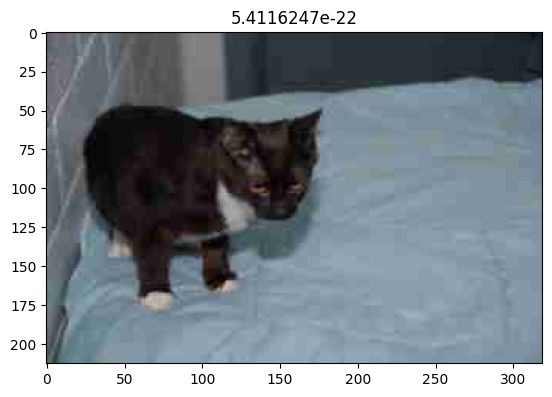

In [ ]:
#prediction for example image
import cv2
dir_name=validation_dogs_dir
dir_name=validation_cats_dir
fnames=os.listdir(dir_name)
mdir=len(fnames)
k=np.random.randint(mdir)
fname=fnames[k]
#wrongly classified images (found below)
#'cat.2355.jpg', 'cat.2366.jpg', 'cat.2391.jpg', 'cat.2415.jpg', 'cat.2476.jpg', 'dog.2018.jpg', 'dog.2271.jpg', 'dog.2287.jpg', 'dog.2339.jpg', 'dog.2397.jpg', 'dog.2408.jpg', 'dog.2423.jpg'
#fname='cat.2355.jpg'
fpath = os.path.join(dir_name,fname)
image = plt.imread(fpath)
image_rs = cv2.resize(image,(224,224)) # -> (224,224,3)
image_pp = preprocess_input(image_rs)
features = conv_base.predict(image_pp.reshape((1,224,224,3)),verbose=0)
apred=model.predict(features.reshape((1,25088)),verbose=0)
print(apred)
plt.imshow(image)
plt.title(apred[0,0])
plt.show()


In [ ]:
atest_pred=model.predict(test_features) #predicted probabilities

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


In [ ]:
test_labels_pred=np.zeros(1000)
test_labels_pred[atest_pred[:,0]>0.5]=1 #predicted classes

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(test_labels,test_labels_pred)

array([[495,   5],
       [  7, 493]])

In [ ]:
validation_dataset.file_paths

['/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2000.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2001.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2002.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2003.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2004.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2005.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2006.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2007.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2008.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2009.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2010.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/cat.2011.jpg',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation/cats/c

In [ ]:
validation_dataset.file_paths[0][-12:]

'cat.2000.jpg'

In [ ]:
#wrongly classified test images
wrong_paths=np.array(validation_dataset.file_paths)[test_labels!=test_labels_pred]

wrong=[]
for path in wrong_paths: #polku=path
  wrong.append(path[-12:])
print(wrong)
prob_wrong=atest_pred[test_labels!=test_labels_pred] #predicted probabilities
print(prob_wrong)


['cat.2355.jpg', 'cat.2366.jpg', 'cat.2391.jpg', 'cat.2415.jpg', 'cat.2476.jpg', 'dog.2018.jpg', 'dog.2271.jpg', 'dog.2287.jpg', 'dog.2339.jpg', 'dog.2397.jpg', 'dog.2408.jpg', 'dog.2423.jpg']
[[1.   ]
 [1.   ]
 [1.   ]
 [1.   ]
 [1.   ]
 [0.   ]
 [0.   ]
 [0.007]
 [0.   ]
 [0.   ]
 [0.   ]
 [0.   ]]


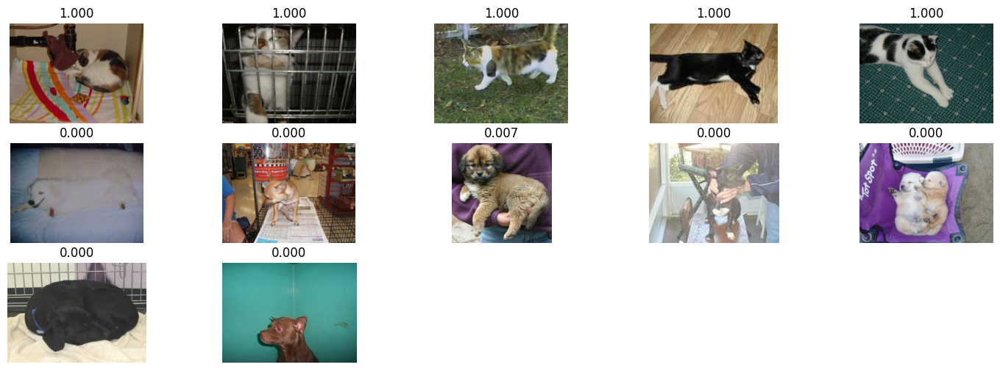

In [ ]:
plt.figure(figsize=(18,6))
k=1
for fname in wrong:
  if fname[0]=='c':
    dir = validation_cats_dir
  else:
    dir = validation_dogs_dir
  path=dir+'/'+fname
  image=plt.imread(path)
  plt.subplot(3,5,k)
  plt.imshow(image)
  plt.axis('off')
  plt.title('{:.3f}'.format(prob_wrong[k-1,0]))
  k+=1
plt.show()



####**Feature extraction + Data augmentation**

Extend conv_base by adding dense layers on top.
This allows the use of data-augmentation to the training data.


Freeze the coefficients in conv_base (i.e they are not updated during the training).



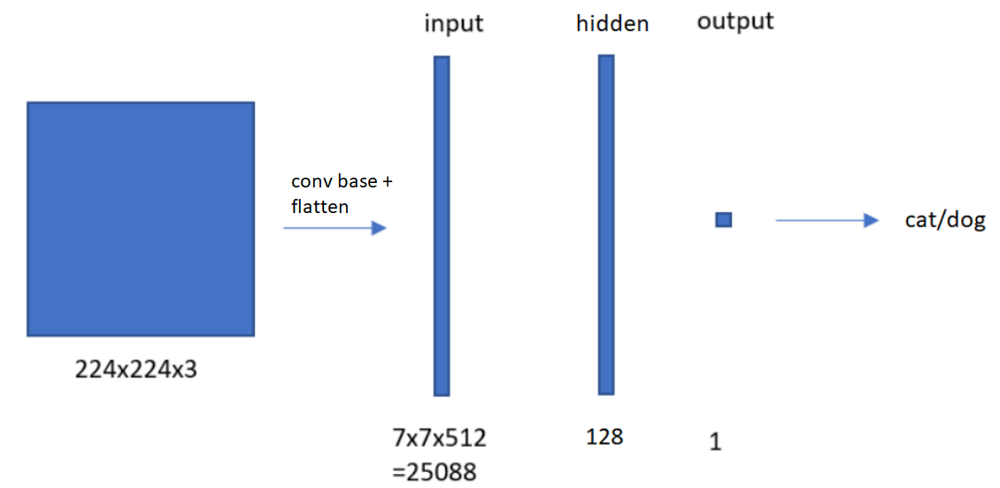

In [ ]:
from keras.api.models import Sequential
from keras.api.layers import Input,Rescaling,Conv2D, MaxPooling2D, Flatten, Dropout, Dense
from keras.api.layers import RandomFlip, RandomRotation,RandomZoom, RandomTranslation


In [ ]:
#read batches of images from folders to size 224x224
from keras.api.utils import image_dataset_from_directory

#image size
img_height=224
img_width=224
#batch size
batch_size=50

train_dataset = image_dataset_from_directory(
    train_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size)

validation_dataset = image_dataset_from_directory(
    validation_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size,
    shuffle=False)

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.


In [ ]:
#layer for data-augmentation

Data_augmentation = Sequential([
        RandomFlip("horizontal"),
        RandomRotation(0.1),
        RandomZoom(0.2),
        RandomTranslation(0.2,0.2)])

In [ ]:
#freeze the coefficients in conv_base
conv_base.trainable=False

In [ ]:
from keras.api.layers import Lambda
model=Sequential()
model.add(Input(shape=(224,224,3)))
model.add(Data_augmentation)
model.add(Lambda(preprocess_input))
model.add(conv_base)
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1,activation='sigmoid'))

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,926,209 (68.38 MB)

 Trainable params: 3,211,521 (12.25 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
from keras.api.optimizers import Adam
model.compile(loss='binary_crossentropy',
              optimizer=Adam(learning_rate=0.0005),
              metrics=['accuracy'])

In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
from keras.api.callbacks import ModelCheckpoint

callback = ModelCheckpoint(filepath='/content/drive/MyDrive/cats_and_dogs_VGG16_v2.weights.h5',
                               monitor='val_accuracy',
                               save_weights_only=True,
                               save_best_only=True,
                               verbose=1)

In [ ]:
history = model.fit(
      train_dataset,
      epochs=30,
      validation_data=validation_dataset,
      callbacks=[callback])

Epoch 1/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 0.7497 - loss: 4.5976
Epoch 1: val_accuracy improved from -inf to 0.96400, saving model to cats_and_dogs_VGG16_v2.weights.h5
40/40 ━━━━━━━━━━━━━━━━━━━━ 26s 415ms/step - accuracy: 0.7521 - loss: 4.5416 - val_accuracy: 0.9640 - val_loss: 0.1385
Epoch 2/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9140 - loss: 0.4036
Epoch 2: val_accuracy improved from 0.96400 to 0.98000, saving model to cats_and_dogs_VGG16_v2.weights.h5
40/40 ━━━━━━━━━━━━━━━━━━━━ 38s 544ms/step - accuracy: 0.9141 - loss: 0.4025 - val_accuracy: 0.9800 - val_loss: 0.0564
Epoch 3/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - accuracy: 0.9238 - loss: 0.2486
Epoch 3: val_accuracy did not improve from 0.98000
40/40 ━━━━━━━━━━━━━━━━━━━━ 17s 434ms/step - accuracy: 0.9237 - loss: 0.2489 - val_accuracy: 0.9770 - val_loss: 0.0587
Epoch 4/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - accuracy: 0.9405 - loss: 0.1749
Epoch 4: val_accuracy improved from 0.9800

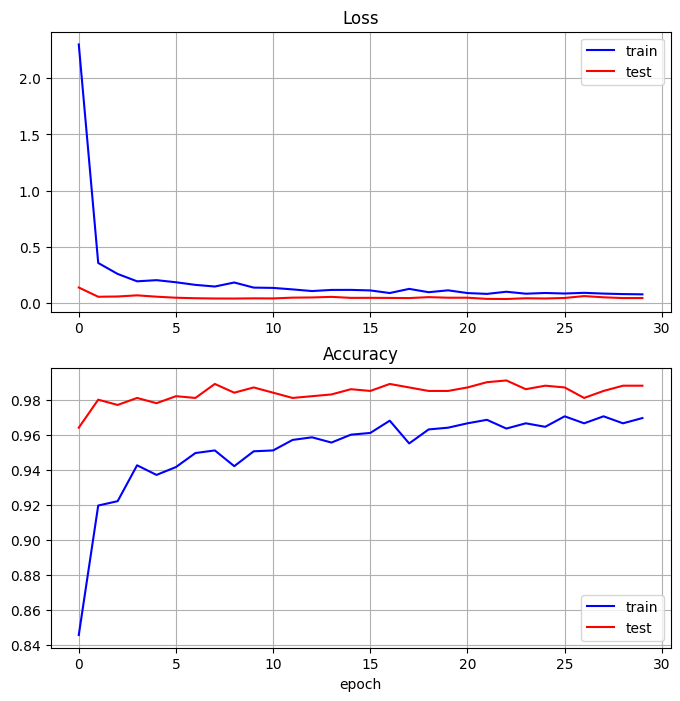

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.title('Loss')
plt.plot(history.history['loss'], color='b', label='train')
plt.plot(history.history['val_loss'], color='r', label='test')
plt.legend()
plt.grid()

plt.subplot(2,1,2)
plt.title('Accuracy')
plt.plot(history.history['accuracy'], color='b', label='train')
plt.plot(history.history['val_accuracy'], color='r', label='test')
plt.legend()
plt.grid()
plt.xlabel('epoch')
plt.show()

In [ ]:
model.load_weights('/content/drive/MyDrive/cats_and_dogs_VGG16_v2.weights.h5')

print(model.evaluate(train_dataset,verbose=0))
print(model.evaluate(validation_dataset,verbose=0))

[0.012618761509656906, 0.9955000281333923]
[0.03650907799601555, 0.9909999966621399]


In [ ]:
#save model
model.save('/content/drive/My Drive/cats_and_dogs_VGG16_v2.keras')

In [ ]:
#load later
from keras.api.models import load_model

custom_objects = {'preprocess_input': preprocess_input}

model = load_model('/content/drive/My Drive/cats_and_dogs_VGG16_v2.keras', custom_objects=custom_objects)

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,349,253 (92.89 MB)

 Trainable params: 3,211,521 (12.25 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

 Optimizer params: 6,423,044 (24.50 MB)

In [ ]:
print(model.evaluate(train_dataset,verbose=0))
print(model.evaluate(validation_dataset,verbose=0))

[0.012618789449334145, 0.9955000281333923]
[0.03650912642478943, 0.9909999966621399]


[[0.]]


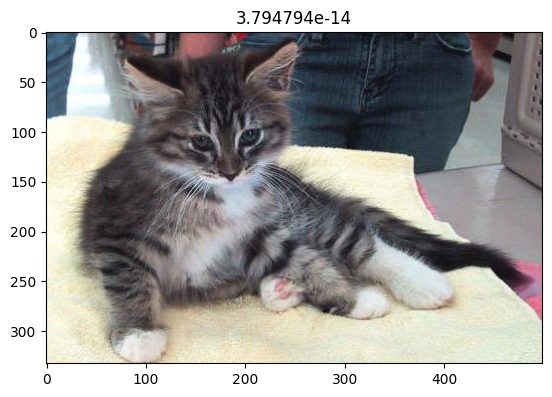

In [ ]:
#prediction for an example image
import cv2
#dir_name=validation_dogs_dir
dir_name=validation_cats_dir
fnames=os.listdir(dir_name)
mdir=len(fnames)
k=np.random.randint(mdir)
fname=fnames[k]
#wrongly classified test-images, found below
#'cat.2391.jpg', 'cat.2422.jpg', 'cat.2457.jpg', 'cat.2476.jpg', 'dog.2018.jpg', 'dog.2264.jpg', 'dog.2271.jpg', 'dog.2339.jpg', 'dog.2478.jpg'
#fname='cat.2391.jpg'
fpath = os.path.join(dir_name,fname)
image = plt.imread(fpath)
image_rs = cv2.resize(image,(224,224)) #to size (224,224,3)
apred=model.predict(image_rs.reshape((1,224,224,3)),verbose=0)
print(apred)
plt.imshow(image)
plt.title(apred[0,0])
plt.show()


In [ ]:
atest_pred=model.predict(validation_dataset) #predictions for validation images

20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 270ms/step


In [ ]:
atest_pred.shape

(1000, 1)

In [ ]:
test_labels_pred=np.zeros(1000)
test_labels_pred[atest_pred[:,0]>0.5]=1

In [ ]:
#classes for validation images
test_labels=np.zeros(1000)
i=0
for images,labels in validation_dataset:

  test_labels[i*batch_size:(i+1)*batch_size]=labels
  i+=1
  if i==20: #20*50=1000 test-figures
    break


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(test_labels,test_labels_pred)

array([[496,   4],
       [  5, 495]])

In [ ]:
#wrongly classified validation images
wrong_paths=np.array(validation_dataset.file_paths)[test_labels!=test_labels_pred]

wrong=[]
for path in wrong_paths: #polku=path
  wrong.append(path[-12:])
print(wrong)
prob_wrong=atest_pred[test_labels!=test_labels_pred] #predicted probabilities
print(prob_wrong)


['cat.2391.jpg', 'cat.2422.jpg', 'cat.2457.jpg', 'cat.2476.jpg', 'dog.2018.jpg', 'dog.2264.jpg', 'dog.2271.jpg', 'dog.2339.jpg', 'dog.2478.jpg']
[[0.946]
 [0.926]
 [0.883]
 [0.96 ]
 [0.225]
 [0.003]
 [0.001]
 [0.206]
 [0.467]]


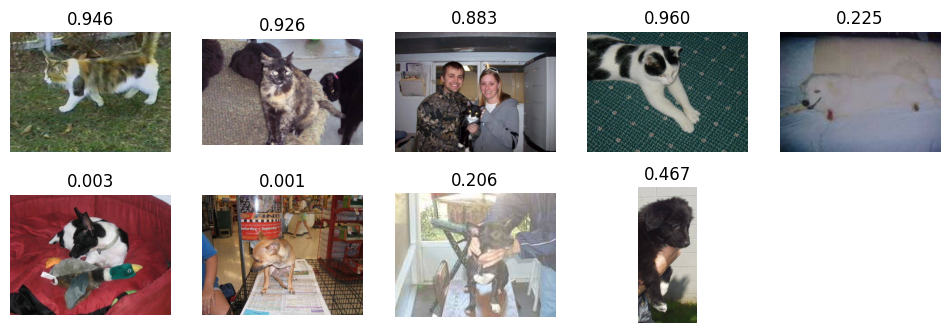

In [ ]:
plt.figure(figsize=(12,6))
k=1
for fname in wrong:
  if fname[0]=='c':
    dir = validation_cats_dir
  else:
    dir = validation_dogs_dir
  path=dir+'/'+fname
  image=plt.imread(path)
  plt.subplot(3,5,k)
  plt.imshow(image)
  plt.axis('off')
  plt.title('{:.3f}'.format(prob_wrong[k-1,0]))
  k+=1
plt.show()

